# Sandbox for new ARotor dataset

For playing around and testing. The contents aren't meant to makes sense afterwards or even run in order.


In [2]:
import os
import pickle
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import pyarrow.dataset as ds
import seaborn as sns
import torch
import math
import librosa
import scipy
import pyarrow.dataset as ds
from tqdm import tqdm
import joblib
from joblib import Parallel, delayed

# import sklearn
from sklearn.metrics import confusion_matrix


In [16]:
a = torch.tensor([i for i in range(26)])
a[: -(len(a) % 5)].view(-1, 1, 5)


tensor([[[ 0,  1,  2,  3,  4]],

        [[ 5,  6,  7,  8,  9]],

        [[10, 11, 12, 13, 14]],

        [[15, 16, 17, 18, 19]],

        [[20, 21, 22, 23, 24]]])

In [10]:
for root, _, files in os.walk("model_weights"):
    files.sort()
    for f in files:
        print(root, f)
    print("---")


model_weights .DS_Store
---
model_weights/anomality_detection_ARotor .DS_Store
---
model_weights/anomality_detection_ARotor/2_10-13_23-25-01 model_0.9185.pth
model_weights/anomality_detection_ARotor/2_10-13_23-25-01 model_0.9270.pth
model_weights/anomality_detection_ARotor/2_10-13_23-25-01 model_0.9293.pth
model_weights/anomality_detection_ARotor/2_10-13_23-25-01 model_0.9313.pth
model_weights/anomality_detection_ARotor/2_10-13_23-25-01 model_0.9393.pth
---
model_weights/anomality_detection_ARotor/5_10-13_23-25-54 model_0.8812.pth
model_weights/anomality_detection_ARotor/5_10-13_23-25-54 model_0.8822.pth
model_weights/anomality_detection_ARotor/5_10-13_23-25-54 model_0.8837.pth
model_weights/anomality_detection_ARotor/5_10-13_23-25-54 model_0.8838.pth
model_weights/anomality_detection_ARotor/5_10-13_23-25-54 model_0.8840.pth
---
model_weights/anomality_detection_ARotor/9_10-13_23-27-03 model_0.8927.pth
model_weights/anomality_detection_ARotor/9_10-13_23-27-03 model_0.8970.pth
model_wei

In [6]:
asd = torch.load(
    os.path.join("model_weights", "anomality_detection_ARotor", "0_10-13_23-23-32", "model_0.9308.pth"),
    map_location=torch.device("cpu"),
)
asd


OrderedDict([('_orig_mod.backbone.stem_1.0.weight',
              tensor([[[-0.3458, -0.4009,  0.6000]],
              
                      [[-0.2810, -0.5031,  0.4122]],
              
                      [[-0.2422, -0.3671, -0.0025]],
              
                      [[-0.0919, -0.1725, -0.3434]],
              
                      [[-0.1793, -0.4945, -0.3316]],
              
                      [[ 0.2034,  0.1817,  0.3981]],
              
                      [[-0.5719,  0.4614, -0.4005]],
              
                      [[-0.3731, -0.2576, -0.0534]]])),
             ('_orig_mod.backbone.stem_1.1.weight',
              tensor([1.0108, 1.0294, 0.9652, 1.0040, 0.9711, 1.0544, 0.9700, 1.0084])),
             ('_orig_mod.backbone.stem_1.1.bias',
              tensor([-0.0047, -0.0182,  0.0025, -0.0392,  0.0230,  0.0262,  0.0056,  0.0521])),
             ('_orig_mod.backbone.stem_1.1.running_mean',
              tensor([-0.0005, -0.0012, -0.0020, -0.0020, -0.0033,  0.

In [19]:
asd = joblib.load(os.path.join("reports", "RAW", "result_generation", "23214163-first", "results_for_config_0.pkl"))
print(asd["accuracies"][0])
print(asd["cfs"][0])
print()
print(asd["accuracies"][-1])
print(asd["cfs"][-1])


0.28725925925925927
[[4756  191  238  124   91]
 [ 424  299  751 2846 1080]
 [ 655 2971  307  126 1341]
 [ 290  866  139 1380 2725]
 [ 164  735  323 3164 1014]]

0.2997037037037037
[[4393  154  299  314  240]
 [ 714  712  741 2337  896]
 [ 569 1057  629 1540 1605]
 [ 338 1575  474 1505 1508]
 [ 705 1142 1057 1643  853]]


In [23]:
asd = joblib.load(os.path.join("reports", "RAW", "result_generation", "23217899-second", "results_for_config_0.pkl"))
print(asd["accuracies"][0])
print(asd["cfs"][0])
print()
print(asd["accuracies"][-1])
print(asd["cfs"][-1])


0.32522222222222225
[[4590  172  251  191  196]
 [ 616    0 1811 1944 1029]
 [ 491 1406  804  921 1778]
 [ 272 1752  212 1442 1722]
 [ 182  554  561 2158 1945]]

0.3171481481481481
[[4852   62  197  174  115]
 [ 446  832  739 1030 2353]
 [ 541  432  116 1010 3301]
 [ 146  723  652 2601 1278]
 [  91 1356 2391 1400  162]]


In [22]:
joblib.load(os.path.join("reports", "RAW", "result_generation", "results_for_config_0.pkl"))


{'accuracies': [0.5246666666666666, 0.4792222222222222],
 'cfs': [array([[1565,   48,  106,   40,   41],
         [ 288,  804,  283,   62,  363],
         [ 247,  173,  912,   20,  448],
         [ 231,  145,  227,  104, 1093],
         [  32,  147,   25,  259, 1337]]),
  array([[1638,    3,  128,    4,   27],
         [ 348,  863,   55,   32,  502],
         [ 561,  115,  324,   73,  727],
         [ 157,   18,   20,  647,  958],
         [ 314,   48,  133,  464,  841]])]}

In [3]:
dataset = ds.dataset(
    os.path.join("data", "processed", "arotor_replication_faults_ds"), format="feather", partitioning="hive"
)

selected_data = dataset.to_table(
    columns=["torque1", "torque2", "rpm", "torque", "fault", "severity"],
    filter=(
        (ds.field("rpm") == 1500)
        & (ds.field("installation") == 1)
        # & ds.field("severity").isin(["mild"])
        & (ds.field("torque") == 1)
        # & ds.field("fault").isin(["pitting"])
    ),
).to_pandas()  # Making drawing easier

selected_data  # [["torque1", "torque2"]]
# asd.tail(asd.size() - 100)


,torque1,torque2,rpm,torque,fault,severity
0,0.918457,4.638062,1500,1,pitting,severe
1,0.993042,4.721069,1500,1,pitting,severe
2,0.910889,4.634705,1500,1,pitting,severe
3,0.765503,4.181519,1500,1,pitting,severe
4,1.121948,4.309082,1500,1,pitting,severe
...,...,...,...,...,...,...
5384095,0.928589,4.331665,1500,1,wear,severe
5384096,1.085327,4.513550,1500,1,wear,severe
5384097,0.811035,4.660339,1500,1,wear,severe
5384098,0.634155,4.781494,1500,1,wear,severe


## Weirdly high


<function matplotlib.pyplot.show(close=None, block=None)>

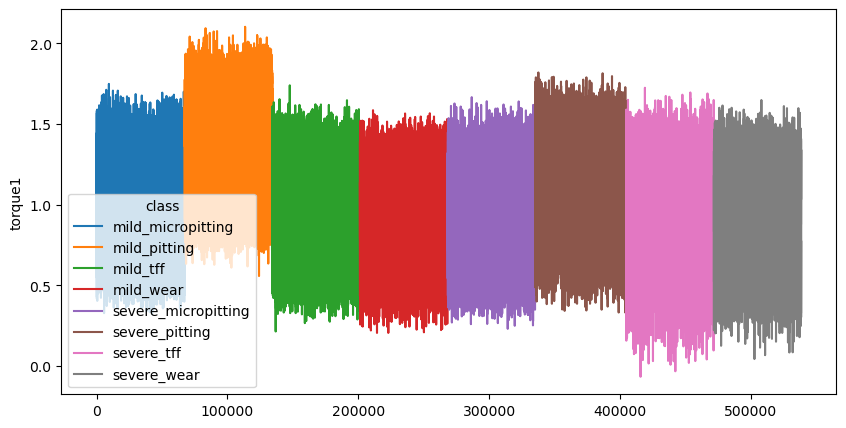

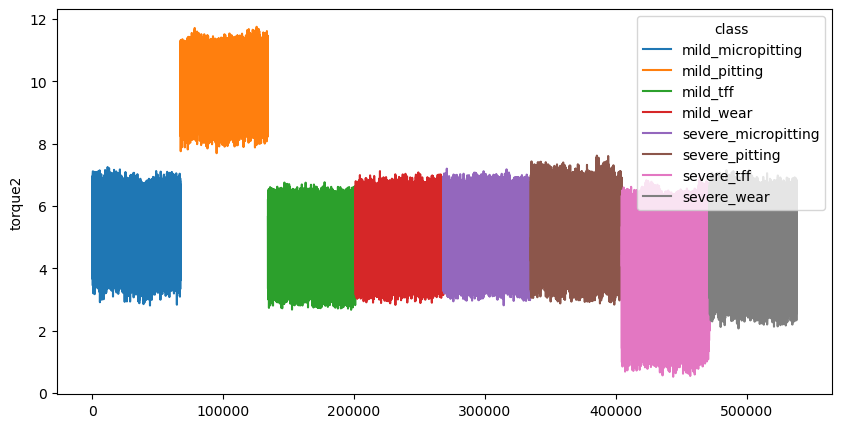

In [277]:
dataset = ds.dataset(
    os.path.join("data", "processed", "arotor_replication_faults_ds"), format="feather", partitioning="hive"
)

selected_data = dataset.to_table(
    columns=["torque1", "torque2", "en1speed", "fault", "severity"],
    filter=(
        (ds.field("rpm") == 1500)
        & (ds.field("installation") == 1)
        # & ds.field("severity").isin(["mild"])
        & (ds.field("torque") == 1)
        # & ds.field("fault").isin(["pitting"])
    ),
).to_pandas()  # Making drawing easier

selected_data["class"] = selected_data["severity"].astype(str) + "_" + selected_data["fault"].astype(str)
selected_data = selected_data.iloc[::10].sort_values(by=["class"]).reset_index(drop=True)

plt.figure(figsize=(10, 5))
sns.lineplot(data=selected_data, y="torque1", x=selected_data.index, hue="class")
plt.show

plt.figure(figsize=(10, 5))
sns.lineplot(data=selected_data, y="torque2", x=selected_data.index, hue="class")
plt.show


## Incorrectly scaled encoders

Very low


mean en1speed    4509.003906
en2speed    4509.004395
en3speed    1502.997803
en4speed       0.000038
en5speed     375.750580
dtype: float32
std en1speed    2.482775e+01
en2speed    6.267591e+01
en3speed    1.676421e+01
en4speed    8.512250e-07
en5speed    1.480682e+01
dtype: float32


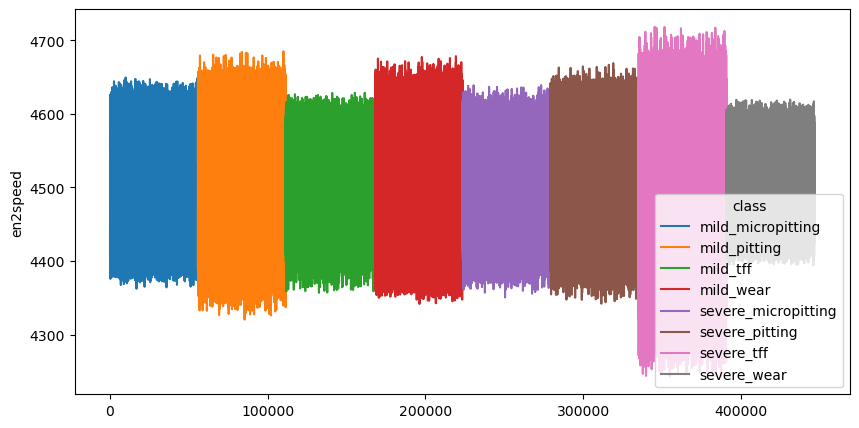

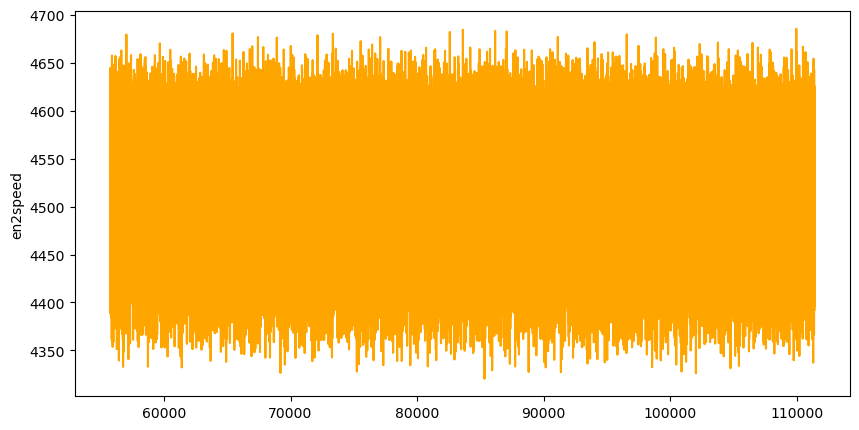

In [369]:
dataset = ds.dataset(
    os.path.join("data", "processed", "arotor_replication_faults_ds"), format="feather", partitioning="hive"
)

selected_data = dataset.to_table(
    columns=["en1speed", "en2speed", "en3speed", "en4speed", "en5speed", "fault", "severity"],
    filter=(
        (ds.field("rpm") == 750)
        & (ds.field("installation") == 2)
        # & ds.field("severity").isin(["mild"])
        & (ds.field("torque") == 11)
        # & ds.field("fault").isin(["pitting"])
    ),
).to_pandas()  # Making drawing easier

selected_data["class"] = selected_data["severity"].astype(str) + "_" + selected_data["fault"].astype(str)
selected_data = selected_data.iloc[::10].sort_values(by=["class"]).reset_index(drop=True)

plt.figure(figsize=(10, 5))
sns.lineplot(data=selected_data, y="en2speed", x=selected_data.index, hue="class")
plt.show

print("mean", selected_data[selected_data["class"] == "mild_pitting"].mean(numeric_only=True))
print("std", selected_data[selected_data["class"] == "mild_pitting"].std(numeric_only=True))

mild_pitting_df = selected_data[selected_data["class"] == "mild_pitting"]
plt.figure(figsize=(10, 5))
sns.lineplot(data=mild_pitting_df, y="en2speed", x=mild_pitting_df.index, color="orange")
plt.show()


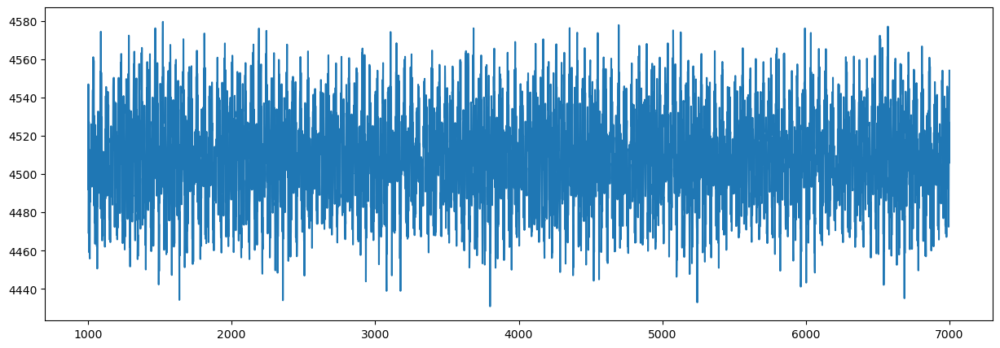

In [276]:
selected_data = (
    dataset.to_table(
        columns=["torque1", "torque2", "en1speed", "en4speed", "en5acc"] + ["fault", "severity", "rpm", "torque"],
        filter=(
            ds.field("rpm").isin([750])
            & ds.field("installation").isin([2])
            & ds.field("severity").isin(["mild"])
            & ds.field("torque").isin([11])
            & ds.field("fault").isin(["pitting"])
        ),
    )
    .to_pandas()
    .iloc[1000:7000]
)

plt.figure(figsize=(15, 5))
plt.plot(selected_data["en1speed"] * 4 * 1e7)


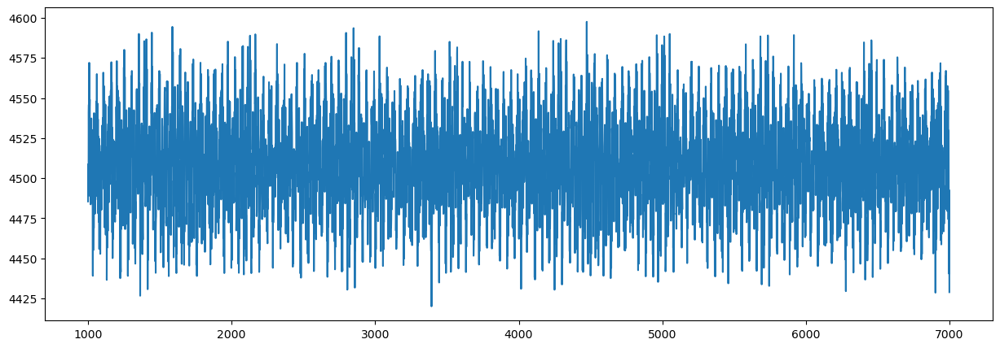

In [275]:
selected_data = (
    dataset.to_table(
        columns=["torque1", "torque2", "en1speed", "en4speed", "en5acc"] + ["fault", "severity", "rpm", "torque"],
        filter=(
            ds.field("rpm").isin([750])
            & ds.field("installation").isin([1])
            & ds.field("severity").isin(["mild"])
            & ds.field("torque").isin([11])
            & ds.field("fault").isin(["pitting"])
        ),
    )
    .to_pandas()
    .iloc[1000:7000]
)

plt.figure(figsize=(15, 5))
plt.plot(selected_data["en1speed"])


## Missing classes


In [204]:
dataset = ds.dataset(
    os.path.join("data", "processed", "arotor_replication_faults_ds"), format="feather", partitioning="hive"
)

for r in [250, 500, 750, 1000, 1250, 1500]:
    for t in [1, 6, 11]:
        for ins in [1, 2]:
            selected_data = dataset.to_table(
                columns=["torque1", "fault", "severity"],
                filter=(
                    (ds.field("rpm") == r)
                    & (ds.field("installation") == ins)
                    # & ds.field("severity").isin(["mild"])
                    & (ds.field("torque") == t)
                    # & ds.field("fault").isin(["pitting"])
                ),
            ).to_pandas()

            selected_data["class"] = selected_data["severity"].astype(str) + "_" + selected_data["fault"].astype(str)
            classes = selected_data["class"].unique()

            if len(classes) != 8:
                print()
                print("DS{} {}rpm {}%".format(ins, r, t))
                print(classes)
                print(len(classes))



DS1 250rpm 1%
[]
0

DS1 250rpm 6%
[]
0

DS1 250rpm 11%
[]
0

DS2 1000rpm 11%
['mild_micropitting' 'mild_wear' 'severe_pitting' 'mild_pitting'
 'severe_micropitting' 'mild_tff']
6


## Weird values compared to other classes


<Axes: ylabel='torque2'>

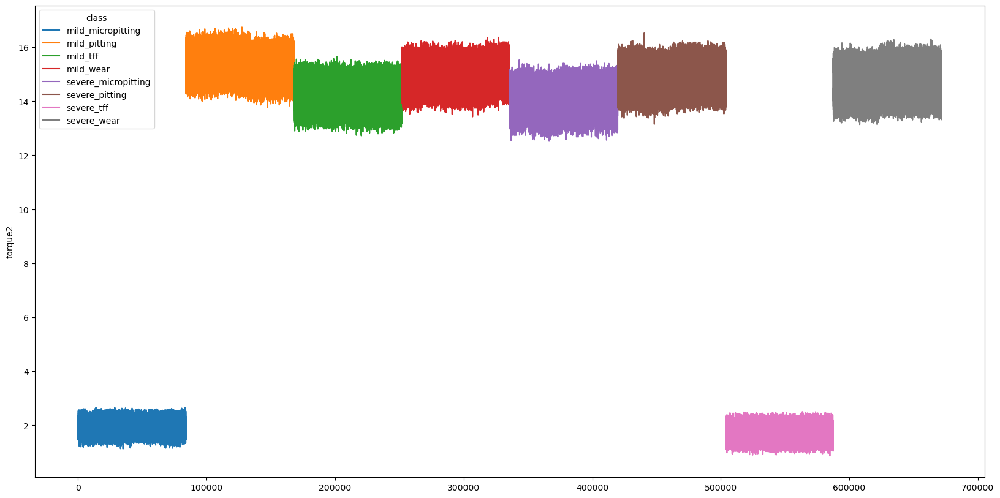

In [198]:
dataset = ds.dataset(
    os.path.join("data", "processed", "arotor_replication_faults_ds"), format="feather", partitioning="hive"
)

selected_data = (
    dataset.to_table(
        columns=["torque1", "torque2", "en1speed", "en4speed", "en5acc"] + ["fault", "severity", "rpm", "torque"],
        filter=(
            ds.field("rpm").isin([1500])
            & ds.field("installation").isin([2])
            # & ds.field("severity").isin(["mild"])
            & ds.field("torque").isin([11])
            # & ds.field("fault").isin(["pitting"])
        ),
    )
    .to_pandas()
    .iloc[::8]  # Makes drawing lighter
)

plt.figure(figsize=(20, 10))
selected_data["class"] = selected_data["severity"].astype(str) + "_" + selected_data["fault"].astype(str)
selected_data = selected_data.sort_values(by=["class"]).reset_index(drop=True)
# selected_data.head(583)
sns.lineplot(data=selected_data, x=selected_data.index, y="torque2", hue="class")


## Smt


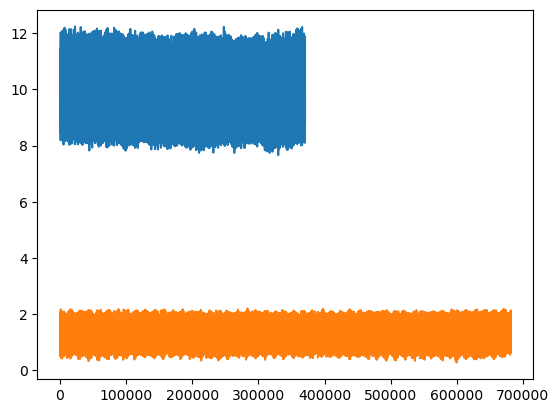

In [3]:
data_folder = "data"

dataset = ds.dataset(
    os.path.join(data_folder, "processed", "arotor_replication_baseline_ds"), format="feather", partitioning="hive"
)
baseline = dataset.to_table(
    columns=["torque2"] + ["severity", "rpm", "torque"],
    filter=(ds.field("rpm").isin([1500]) & ds.field("torque").isin([6]) & ds.field("severity").isin([7])),
).to_pandas()

dataset = ds.dataset(
    os.path.join(data_folder, "processed", "arotor_replication_faults_ds"), format="feather", partitioning="hive"
)
fault = dataset.to_table(
    columns=["torque2"] + ["severity", "rpm", "torque"],
    filter=(
        ds.field("rpm").isin([1500])
        & ds.field("installation").isin([2])
        & ds.field("severity").isin(["severe"])
        & ds.field("torque").isin([6])
        & ds.field("fault").isin(["tff"])
    ),
).to_pandas()

plt.plot(baseline["torque2"])

plt.plot(fault["torque2"])


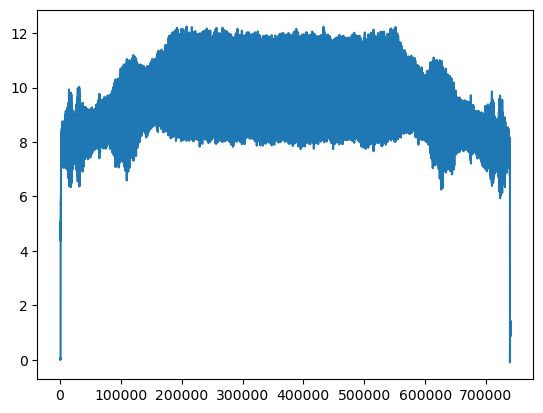

In [30]:
asd = pd.read_feather(
    os.path.join(
        "data",
        "RAW",
        "ARotor_replication",
        "Baseline",
        "GP7",
        "3012Hz",
        "sensor",
        "1500rpm_CT_baseline_6%_GP7_0_0,25_0,74.feather",
    )
)
plt.plot(asd["Torq1"])


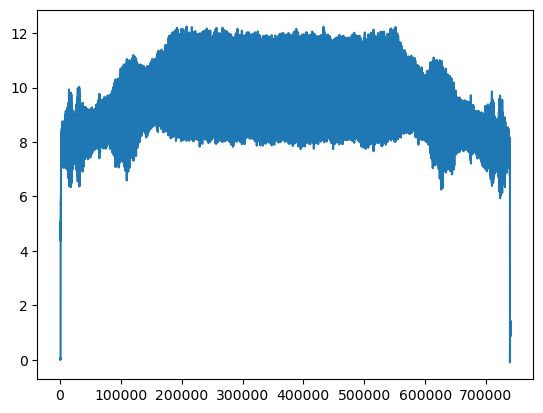

In [29]:
asd = pd.read_csv(os.path.join("data", "RAW", "ARotor_replication", "1500rpm_CT_baseline_6%_GP7_0.csv"))
plt.plot(asd["Torq1"])


## Initial data look


In [61]:
data_folder = os.path.join("data", "RAW", "ARotor_replication")
data_filler = os.path.join("data_set_1", "3012Hz", "sensor")

# Severe wear
df_sw_500 = pd.read_feather(
    os.path.join(data_folder, "Faults", "GP2_severe_wear", data_filler, "500rpm_CT_failure_1%_GP2_0_0,2_0,8.feather")
)
df_sw_500 = df_sw_500.iloc[int(len(df_sw_500) * 0.2) : int(len(df_sw_500) * 0.8)].reset_index(drop=True)

df_sw_1500 = pd.read_feather(
    os.path.join(data_folder, "Faults", "GP2_severe_wear", data_filler, "1500rpm_CT_failure_1%_GP2_0_0,2_0,8.feather")
)
df_sw_1500 = df_sw_1500.iloc[int(len(df_sw_1500) * 0.2) : int(len(df_sw_1500) * 0.8)].reset_index(drop=True)

# Severe TFF
df_stff_500 = pd.read_feather(
    os.path.join(data_folder, "Faults", "GP5_severe_tff", data_filler, "500rpm_CT_failure_1%_GP5_0_0,2_0,8.feather")
)
df_stff_500 = df_stff_500.iloc[int(len(df_stff_500) * 0.2) : int(len(df_stff_500) * 0.8)].reset_index(drop=True)

df_stff_1500 = pd.read_feather(
    os.path.join(data_folder, "Faults", "GP5_severe_tff", data_filler, "1500rpm_CT_failure_1%_GP5_0_0,2_0,8.feather")
)
df_stff_1500 = df_stff_1500.iloc[int(len(df_stff_1500) * 0.2) : int(len(df_stff_1500) * 0.8)].reset_index(drop=True)

# Severe pitting
df_sp_500 = pd.read_feather(
    os.path.join(data_folder, "Faults", "GP6_severe_pitting", data_filler, "500rpm_CT_failure_1%_GP6_0_0,2_0,8.feather")
)
df_sp_500 = df_stff_500.iloc[int(len(df_sp_500) * 0.2) : int(len(df_sp_500) * 0.8)].reset_index(drop=True)

df_sp_1500 = pd.read_feather(
    os.path.join(
        data_folder, "Faults", "GP6_severe_pitting", data_filler, "1500rpm_CT_failure_1%_GP6_0_0,2_0,8.feather"
    )
)
df_sp_1500 = df_sp_1500.iloc[int(len(df_sp_1500) * 0.2) : int(len(df_sp_1500) * 0.8)].reset_index(drop=True)

df_sw_500


,time,enc1_ang,enc1_time,enc2_ang,enc2_time,enc3_ang,enc3_time,enc4_ang,enc4_time,enc5_ang,enc5_time,acc1,acc2,acc3,acc4,Torq1,Torq2
0,57.767988,142301.106,57.768301,142300.692,57.768302,47433.510,57.768288,-47433.492,57.768302,11858.310,57.768261,8.571017,2.922561,2.786767,-0.736470,4.519958,0.948853
1,57.768320,142302.096,57.768630,142301.682,57.768632,47433.852,57.768631,-47433.816,57.768625,11858.400,57.768623,2.739942,26.413183,-6.448046,-2.267286,4.561462,0.886841
2,57.768652,142303.086,57.768962,142302.690,57.768968,47434.176,57.768958,-47434.158,57.768967,11858.472,57.768913,-3.393063,2.448875,-1.618848,-3.367964,4.567871,0.885620
3,57.768984,142304.094,57.769296,142303.680,57.769299,47434.518,57.769297,-47434.482,57.769292,11858.562,57.769274,-9.668510,-11.170482,-1.031096,1.176161,4.590149,0.975342
4,57.769316,142305.102,57.769632,142304.670,57.769628,47434.842,57.769623,-47434.806,57.769615,11858.634,57.769564,-24.423384,-3.929026,3.916571,2.837432,4.679565,0.871704
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
521995,231.070332,663247.998,231.070641,663247.638,231.070639,221082.462,231.070630,-221082.444,231.070639,55270.566,231.070603,-48.553828,6.709613,2.007218,4.264765,5.119934,0.764282
521996,231.070664,663249.006,231.070975,663248.646,231.070976,221082.804,231.070972,-221082.768,231.070959,55270.656,231.070956,30.907954,9.925114,0.870203,-1.783954,4.979553,0.852783
521997,231.070996,663249.996,231.071307,663249.636,231.071307,221083.128,231.071292,-221083.110,231.071297,55270.728,231.071237,33.517628,5.394943,0.929765,-0.576421,4.992371,0.857788
521998,231.071328,663250.986,231.071638,663250.626,231.071637,221083.470,231.071636,-221083.452,231.071635,55270.818,231.071588,-22.121166,-11.373424,-0.154337,0.596649,4.944458,0.792114


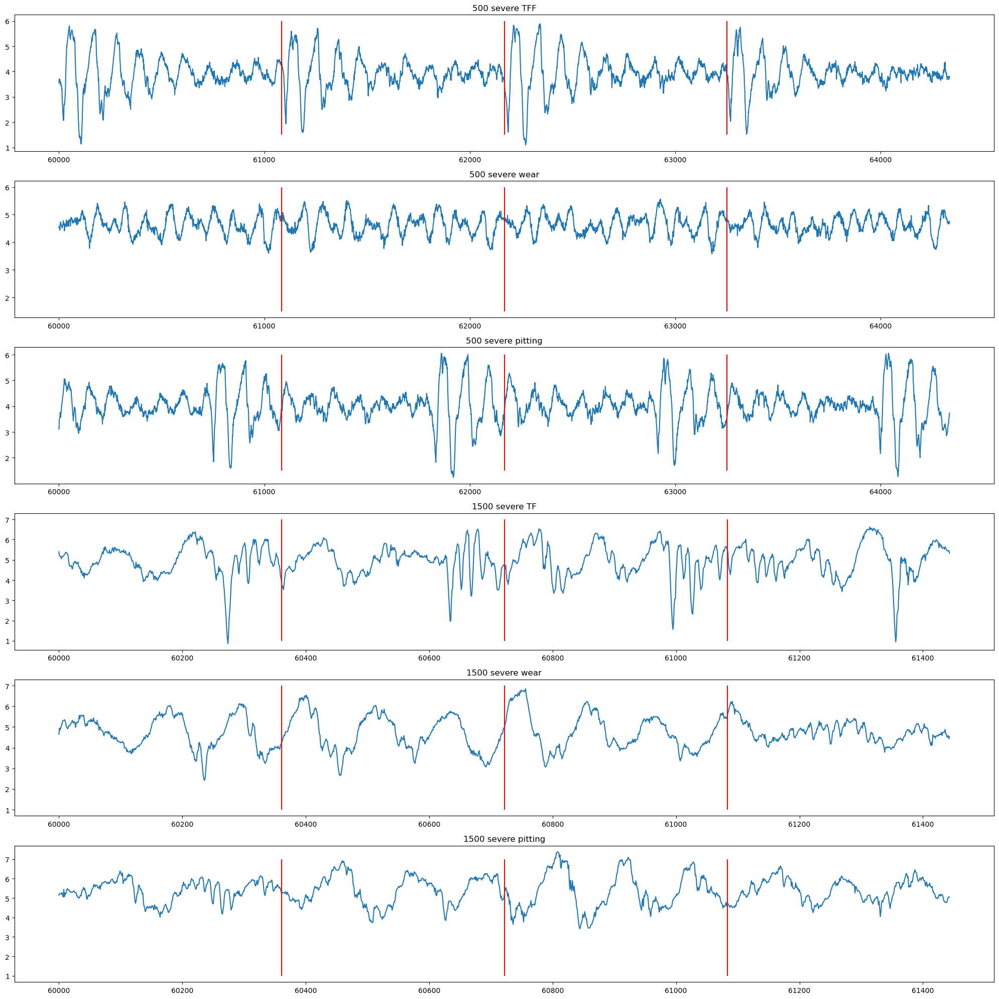

In [5]:
sensor = "Torq1"
offset = 60000

fig, axs = plt.subplots(6, 1, figsize=(20, 20))
axs = axs.flatten()

axs[0].plot(df_stff_500[sensor].iloc[offset : offset + 1084 * 4])
axs[0].set_title("500 severe TFF")
axs[1].plot(df_sw_500[sensor].iloc[offset : offset + 1084 * 4])
axs[1].set_title("500 severe wear")
axs[2].plot(df_sp_500[sensor].iloc[offset : offset + 1084 * 4])
axs[2].set_title("500 severe pitting")

for i in range(3):
    axs[i].vlines(offset + 1084, 1.5, 6, color="r")
    axs[i].vlines(offset + 1084 * 2, 1.5, 6, color="r")
    axs[i].vlines(offset + 1084 * 3, 1.5, 6, color="r")

axs[3].plot(df_stff_1500[sensor].iloc[offset : offset + 361 * 4])
axs[3].set_title("1500 severe TF")
axs[4].plot(df_sw_1500[sensor].iloc[offset : offset + 361 * 4])
axs[4].set_title("1500 severe wear")
axs[5].plot(df_sp_1500[sensor].iloc[offset : offset + 361 * 4])
axs[5].set_title("1500 severe pitting")

for i in range(3, 6):
    axs[i].vlines(offset + 361, 1, 7, color="r")
    axs[i].vlines(offset + 361 * 2, 1, 7, color="r")
    axs[i].vlines(offset + 361 * 3, 1, 7, color="r")

plt.tight_layout()


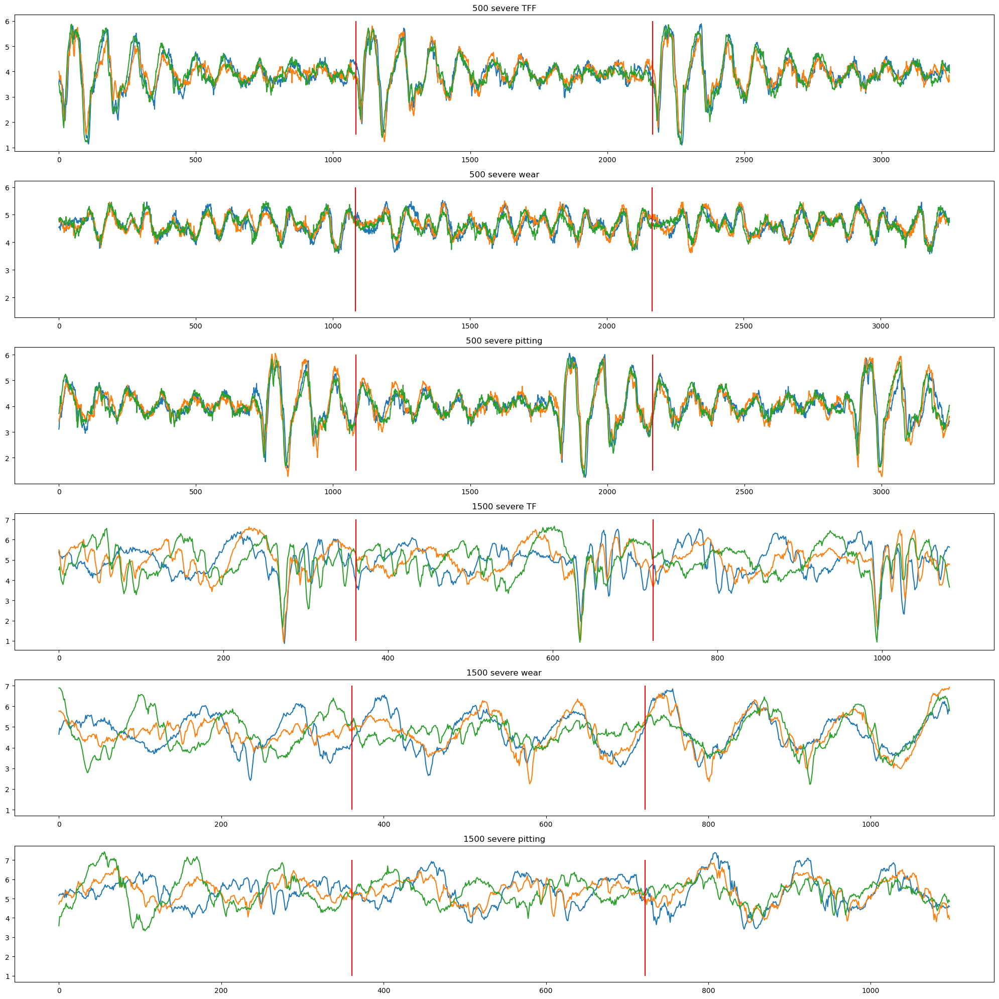

In [6]:
sensor = "Torq1"
offset = 60000

fig, axs = plt.subplots(6, 1, figsize=(20, 20))
axs = axs.flatten()

axs[0].plot(np.array(df_stff_500[sensor])[offset : offset + 1083 * 3])
axs[0].plot(np.array(df_stff_500[sensor])[offset + 1083 * 3 : offset + 1083 * 6])
axs[0].plot(np.array(df_stff_500[sensor])[offset + 1083 * 6 : offset + 1083 * 9])
axs[0].set_title("500 severe TFF")

axs[1].plot(np.array(df_sw_500[sensor])[offset : offset + 1084 * 3])
axs[1].plot(np.array(df_sw_500[sensor])[offset + 1083 * 3 : offset + 1083 * 6])
axs[1].plot(np.array(df_sw_500[sensor])[offset + 1083 * 6 : offset + 1083 * 9])
axs[1].set_title("500 severe wear")

axs[2].plot(np.array(df_sp_500[sensor])[offset : offset + 1083 * 3])
axs[2].plot(np.array(df_sp_500[sensor])[offset + 1083 * 3 : offset + 1083 * 6])
axs[2].plot(np.array(df_sp_500[sensor])[offset + 1083 * 6 : offset + 1083 * 9])
axs[2].set_title("500 severe pitting")

for i in range(3):
    axs[i].vlines(1083, 1.5, 6, color="r")
    axs[i].vlines(1083 * 2, 1.5, 6, color="r")
    # axs[i].vlines(1084 * 3, 1.5, 6, color="r")

axs[3].plot(np.array(df_stff_1500[sensor])[offset : offset + 361 * 3])
axs[3].plot(np.array(df_stff_1500[sensor])[offset + 361 * 3 : offset + 361 * 6])
axs[3].plot(np.array(df_stff_1500[sensor])[offset + 361 * 6 : offset + 361 * 9])
axs[3].set_title("1500 severe TF")

axs[4].plot(np.array(df_sw_1500[sensor])[offset : offset + 366 * 3])
axs[4].plot(np.array(df_sw_1500[sensor])[offset + 366 * 3 : offset + 366 * 6])
axs[4].plot(np.array(df_sw_1500[sensor])[offset + 366 * 6 : offset + 366 * 9])
axs[4].set_title("1500 severe wear")

axs[5].plot(np.array(df_sp_1500[sensor])[offset : offset + 366 * 3])
axs[5].plot(np.array(df_sp_1500[sensor])[offset + 366 * 3 : offset + 366 * 6])
axs[5].plot(np.array(df_sp_1500[sensor])[offset + 366 * 6 : offset + 366 * 9])
axs[5].set_title("1500 severe pitting")

for i in range(3, 6):
    axs[i].vlines(361, 1, 7, color="r")
    axs[i].vlines(361 * 2, 1, 7, color="r")
    # axs[i].vlines(offset + 361 * 3, 1, 7, color="r")

plt.tight_layout()


In [7]:
df_sp_1500["enc1_ang"].diff()


0           NaN
1         3.006
2         2.970
3         2.988
4         3.024
          ...  
695695    3.006
695696    2.988
695697    2.988
695698    3.006
695699    2.970
Name: enc1_ang, Length: 695700, dtype: float64

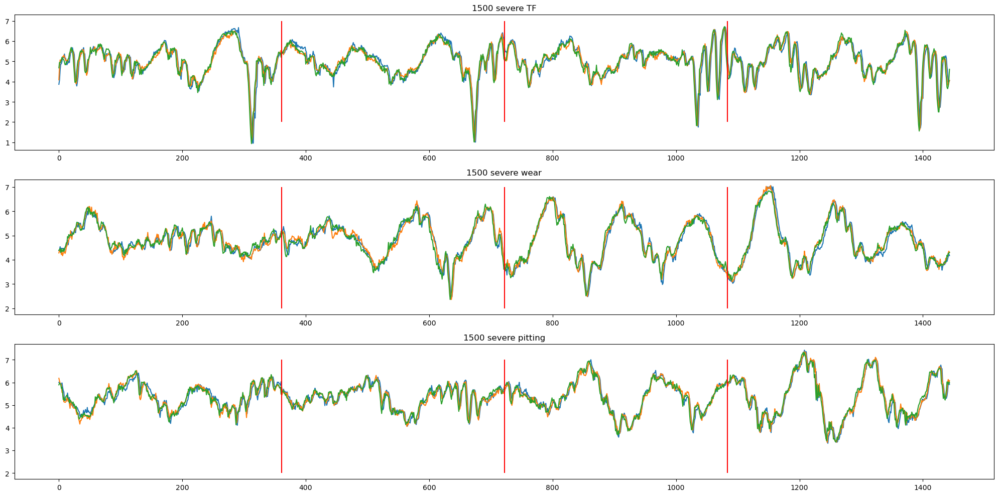

In [8]:
sensor = "Torq1"
offset = 100000

fig, axs = plt.subplots(3, 1, figsize=(20, 10))
axs = axs.flatten()

axs[0].plot(np.array(df_stff_1500[sensor])[offset : offset + 361 * 4])
axs[0].plot(np.array(df_stff_1500[sensor])[offset + 361 * 4 : offset + 361 * 8])
axs[0].plot(np.array(df_stff_1500[sensor])[offset + 361 * 8 : offset + 361 * 12])
axs[0].set_title("1500 severe TF")

axs[1].plot(np.array(df_sw_1500[sensor])[offset : offset + 361 * 4])
axs[1].plot(np.array(df_sw_1500[sensor])[offset + 361 * 4 : offset + 361 * 8])
axs[1].plot(np.array(df_sw_1500[sensor])[offset + 361 * 8 : offset + 361 * 12])
axs[1].set_title("1500 severe wear")

axs[2].plot(np.array(df_sp_1500[sensor])[offset : offset + 361 * 4])
axs[2].plot(np.array(df_sp_1500[sensor])[offset + 361 * 4 : offset + 361 * 8])
axs[2].plot(np.array(df_sp_1500[sensor])[offset + 361 * 8 : offset + 361 * 12])
axs[2].set_title("1500 severe pitting")

for i in range(0, 3):
    axs[i].vlines(361, 2, 7, color="r")
    axs[i].vlines(361 * 2, 2, 7, color="r")
    axs[i].vlines(361 * 3, 2, 7, color="r")

plt.tight_layout()


In [9]:
df_stff_500


,time,enc1_ang,enc1_time,enc2_ang,enc2_time,enc3_ang,enc3_time,enc4_ang,enc4_time,enc5_ang,enc5_time,acc1,acc2,acc3,acc4,Torq1,Torq2
0,57.701602,141757.992,57.701899,141757.578,57.701896,47252.466,57.701891,-47252.412,57.701887,11813.058,57.701874,-7.575040,6.901316,1.590846,-4.736296,4.797668,0.869141
1,57.701934,141758.982,57.702229,141758.586,57.702231,47252.808,57.702231,-47252.754,57.702232,11813.130,57.702166,17.460352,-7.662510,2.579331,2.708475,4.730530,0.804688
2,57.702266,141759.972,57.702559,141759.576,57.702561,47253.132,57.702554,-47253.078,57.702554,11813.220,57.702531,4.771135,-13.863412,1.548985,1.024727,4.721069,0.862915
3,57.702598,141760.980,57.702894,141760.584,57.702894,47253.456,57.702881,-47253.402,57.702878,11813.310,57.702893,3.149571,1.586726,1.617443,1.184589,4.781494,0.784546
4,57.702930,141761.970,57.703222,141761.574,57.703223,47253.798,57.703222,-47253.744,57.703219,11813.382,57.703184,23.110212,9.497317,-3.396247,-2.982217,4.721069,0.860352
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
521395,230.804727,662106.024,230.805040,662105.610,230.805036,220701.834,230.805027,-220701.798,230.805032,55175.400,230.805036,33.505921,3.064348,-0.377694,0.493821,5.011292,0.783203
521396,230.805059,662107.014,230.805369,662106.618,230.805372,220702.176,230.805364,-220702.140,230.805369,55175.472,230.805320,11.093595,10.614196,-3.185439,-3.624006,4.829407,0.881836
521397,230.805391,662108.022,230.805704,662107.608,230.805700,220702.500,230.805688,-220702.464,230.805696,55175.562,230.805677,-29.712408,-1.888843,3.290234,5.656416,4.778442,0.848999
521398,230.805723,662109.012,230.806033,662108.616,230.806032,220702.842,230.806033,-220702.788,230.806024,55175.652,230.806035,-9.812639,-10.595841,-3.630468,4.163434,4.577332,0.797119


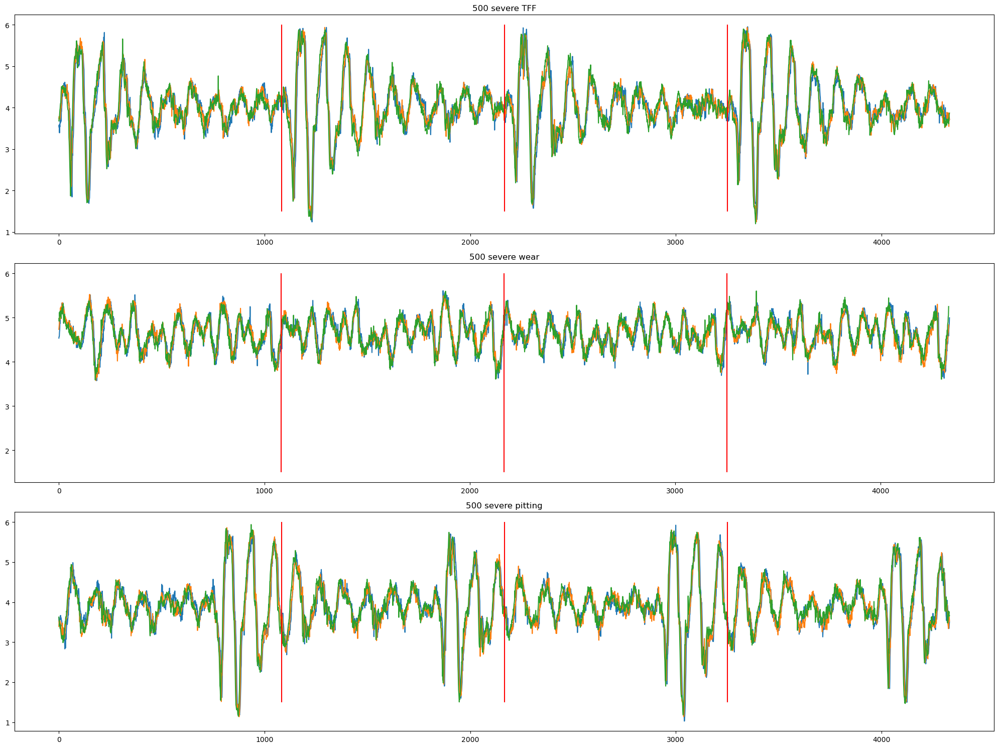

In [12]:
sensor = "Torq1"
offset = 100000

fig, axs = plt.subplots(3, 1, figsize=(20, 15))
axs = axs.flatten()

axs[0].plot(np.array(df_stff_500[sensor])[offset : offset + 1083 * 4])
axs[0].plot(np.array(df_stff_500[sensor])[offset + 1083 * 4 : offset + 1083 * 8])
axs[0].plot(np.array(df_stff_500[sensor])[offset + 1083 * 8 : offset + 1083 * 12])
axs[0].set_title("500 severe TFF")

axs[1].plot(np.array(df_sw_500[sensor])[offset : offset + 1084 * 4])
axs[1].plot(np.array(df_sw_500[sensor])[offset + 1083 * 4 : offset + 1083 * 8])
axs[1].plot(np.array(df_sw_500[sensor])[offset + 1083 * 8 : offset + 1083 * 12])
axs[1].set_title("500 severe wear")

axs[2].plot(np.array(df_sp_500[sensor])[offset : offset + 1083 * 4])
axs[2].plot(np.array(df_sp_500[sensor])[offset + 1083 * 4 : offset + 1083 * 8])
axs[2].plot(np.array(df_sp_500[sensor])[offset + 1083 * 8 : offset + 1083 * 12])
axs[2].set_title("500 severe pitting")

for i in range(3):
    axs[i].vlines(1083, 1.5, 6, color="r")
    axs[i].vlines(1083 * 2, 1.5, 6, color="r")
    axs[i].vlines(1084 * 3, 1.5, 6, color="r")

plt.tight_layout()


## Healthy gear pair testing


### 500


In [13]:
data_folder = os.path.join("data", "RAW", "ARotor_replication")

df_GP1 = pd.read_feather(
    # os.path.join(data_folder, "Baseline", "GP1", "3012Hz", "sensor", "500rpm_CT_baseline_11%_GP1_0_0,15_0,85.feather")
    # os.path.join(data_folder, "Baseline", "GP1", "3012Hz", "sensor", "500rpm_CT_baseline_6%_GP1_0_0,17_0,83.feather")
    os.path.join(data_folder, "Baseline", "GP1", "3012Hz", "sensor", "500rpm_CT_baseline_1%_GP1_0_0,15_0,85.feather")
)
df_GP1 = df_GP1.iloc[int(len(df_GP1) * 0.25) : int(len(df_GP1) * 0.75)].reset_index(drop=True)

df_GP2 = pd.read_feather(
    # os.path.join(data_folder, "Baseline", "GP2", "3012Hz", "sensor", "500rpm_CT_baseline_6%_GP2_0_0,17_0,83.feather")
    os.path.join(data_folder, "Baseline", "GP2", "3012Hz", "sensor", "500rpm_CT_baseline_1%_GP2_0_0,17_0,83.feather")
)
df_GP2 = df_GP2.iloc[int(len(df_GP2) * 0.25) : int(len(df_GP2) * 0.75)].reset_index(drop=True)

df_GP3 = pd.read_feather(
    # os.path.join(data_folder, "Baseline", "GP3", "3012Hz", "sensor", "500rpm_CT_baseline_6%_GP3_0_0,17_0,83.feather")
    os.path.join(data_folder, "Baseline", "GP3", "3012Hz", "sensor", "500rpm_CT_baseline_1%_GP3_0_0,17_0,83.feather")
)
df_GP3 = df_GP3.iloc[int(len(df_GP3) * 0.25) : int(len(df_GP3) * 0.75)].reset_index(drop=True)

df_GP4 = pd.read_feather(
    os.path.join(data_folder, "Baseline", "GP4", "3012Hz", "sensor", "500rpm_CT_baseline_1%_GP4_0_0,15_0,85.feather")
)
df_GP4 = df_GP4.iloc[int(len(df_GP4) * 0.25) : int(len(df_GP4) * 0.75)].reset_index(drop=True)

df_GP5 = pd.read_feather(
    os.path.join(data_folder, "Baseline", "GP5", "3012Hz", "sensor", "500rpm_CT_baseline_1%_GP5_0_0,17_0,83.feather")
)
df_GP5 = df_GP5.iloc[int(len(df_GP5) * 0.25) : int(len(df_GP5) * 0.75)].reset_index(drop=True)

df_GP6 = pd.read_feather(
    os.path.join(data_folder, "Baseline", "GP6", "3012Hz", "sensor", "500rpm_CT_baseline_1%_GP6_0_0,17_0,83.feather")
)
df_GP6 = df_GP6.iloc[int(len(df_GP6) * 0.25) : int(len(df_GP6) * 0.75)].reset_index(drop=True)

df_GP7 = pd.read_feather(
    os.path.join(data_folder, "Baseline", "GP7", "3012Hz", "sensor", "500rpm_CT_baseline_1%_GP7_0_0,15_0,85.feather")
)
df_GP7 = df_GP7.iloc[int(len(df_GP7) * 0.25) : int(len(df_GP7) * 0.75)].reset_index(drop=True)

df_GP8 = pd.read_feather(
    os.path.join(data_folder, "Baseline", "GP8", "3012Hz", "sensor", "500rpm_CT_baseline_1%_GP8_0_0,17_0,83.feather")
)
df_GP8 = df_GP8.iloc[int(len(df_GP8) * 0.25) : int(len(df_GP8) * 0.75)].reset_index(drop=True)

df_GP9 = pd.read_feather(
    os.path.join(data_folder, "Baseline", "GP9", "3012Hz", "sensor", "500rpm_CT_baseline_1%_GP9_0_0,17_0,83.feather")
)
df_GP9 = df_GP9.iloc[int(len(df_GP9) * 0.25) : int(len(df_GP9) * 0.75)].reset_index(drop=True)


In [14]:
df_GP1_mild_pitting = pd.read_feather(
    os.path.join(
        data_folder,
        "Faults",
        "GP1_mild_pitting",
        "data_set_1",
        "3012Hz",
        "sensor",
        "500rpm_CT_failure_1%_GP1_0_0,2_0,8.feather",
    )
)
df_GP1_mild_pitting = df_GP1_mild_pitting.iloc[
    int(len(df_GP1_mild_pitting) * 0.25) : int(len(df_GP1_mild_pitting) * 0.75)
].reset_index(drop=True)

df_GP2_severe_wear = pd.read_feather(
    os.path.join(
        data_folder,
        "Faults",
        "GP2_severe_wear",
        "data_set_1",
        "3012Hz",
        "sensor",
        "500rpm_CT_failure_1%_GP2_0_0,2_0,8.feather",
    )
)
df_GP2_severe_wear = df_GP2_severe_wear.iloc[
    int(len(df_GP2_severe_wear) * 0.25) : int(len(df_GP2_severe_wear) * 0.75)
].reset_index(drop=True)

df_GP3_severe_micropitting = pd.read_feather(
    os.path.join(
        data_folder,
        "Faults",
        "GP3_severe_micropitting",
        "data_set_1",
        "3012Hz",
        "sensor",
        "500rpm_CT_failure_1%_GP3_0_0,2_0,8.feather",
    )
)
df_GP3_severe_micropitting = df_GP3_severe_micropitting.iloc[
    int(len(df_GP3_severe_micropitting) * 0.25) : int(len(df_GP3_severe_micropitting) * 0.75)
].reset_index(drop=True)

df_GP4_mild_micropitting = pd.read_feather(
    os.path.join(
        data_folder,
        "Faults",
        "GP4_mild_micropitting",
        "data_set_1",
        "3012Hz",
        "sensor",
        "500rpm_CT_failure_1%_GP4_0_0,2_0,8.feather",
    )
)
df_GP4_mild_micropitting = df_GP4_mild_micropitting.iloc[
    int(len(df_GP4_mild_micropitting) * 0.25) : int(len(df_GP4_mild_micropitting) * 0.75)
].reset_index(drop=True)

df_GP5_severe_tff = pd.read_feather(
    os.path.join(
        data_folder,
        "Faults",
        "GP5_severe_tff",
        "data_set_1",
        "3012Hz",
        "sensor",
        "500rpm_CT_failure_1%_GP5_0_0,2_0,8.feather",
    )
)
df_GP5_severe_tff = df_GP5_severe_tff.iloc[
    int(len(df_GP5_severe_tff) * 0.25) : int(len(df_GP5_severe_tff) * 0.75)
].reset_index(drop=True)

df_GP6_severe_pitting = pd.read_feather(
    os.path.join(
        data_folder,
        "Faults",
        "GP6_severe_pitting",
        "data_set_1",
        "3012Hz",
        "sensor",
        "500rpm_CT_failure_1%_GP6_0_0,2_0,8.feather",
    )
)
df_GP6_severe_pitting = df_GP6_severe_pitting.iloc[
    int(len(df_GP6_severe_pitting) * 0.25) : int(len(df_GP6_severe_pitting) * 0.75)
].reset_index(drop=True)

df_GP7_mild_wear = pd.read_feather(
    os.path.join(
        data_folder,
        "Faults",
        "GP7_mild_wear",
        "data_set_1",
        "3012Hz",
        "sensor",
        "500rpm_CT_failure_1%_GP7_0_0,2_0,8.feather",
    )
)
df_GP7_mild_wear = df_GP7_mild_wear.iloc[
    int(len(df_GP7_mild_wear) * 0.25) : int(len(df_GP7_mild_wear) * 0.75)
].reset_index(drop=True)

df_GP9_mild_tff = pd.read_feather(
    os.path.join(
        data_folder,
        "Faults",
        "GP9_mild_tff",
        "data_set_1",
        "3012Hz",
        "sensor",
        "500rpm_CT_failure_1%_GP9_0_0,2_0,8.feather",
    )
)
df_GP9_mild_tff = df_GP9_mild_tff.iloc[int(len(df_GP9_mild_tff) * 0.25) : int(len(df_GP9_mild_tff) * 0.75)].reset_index(
    drop=True
)


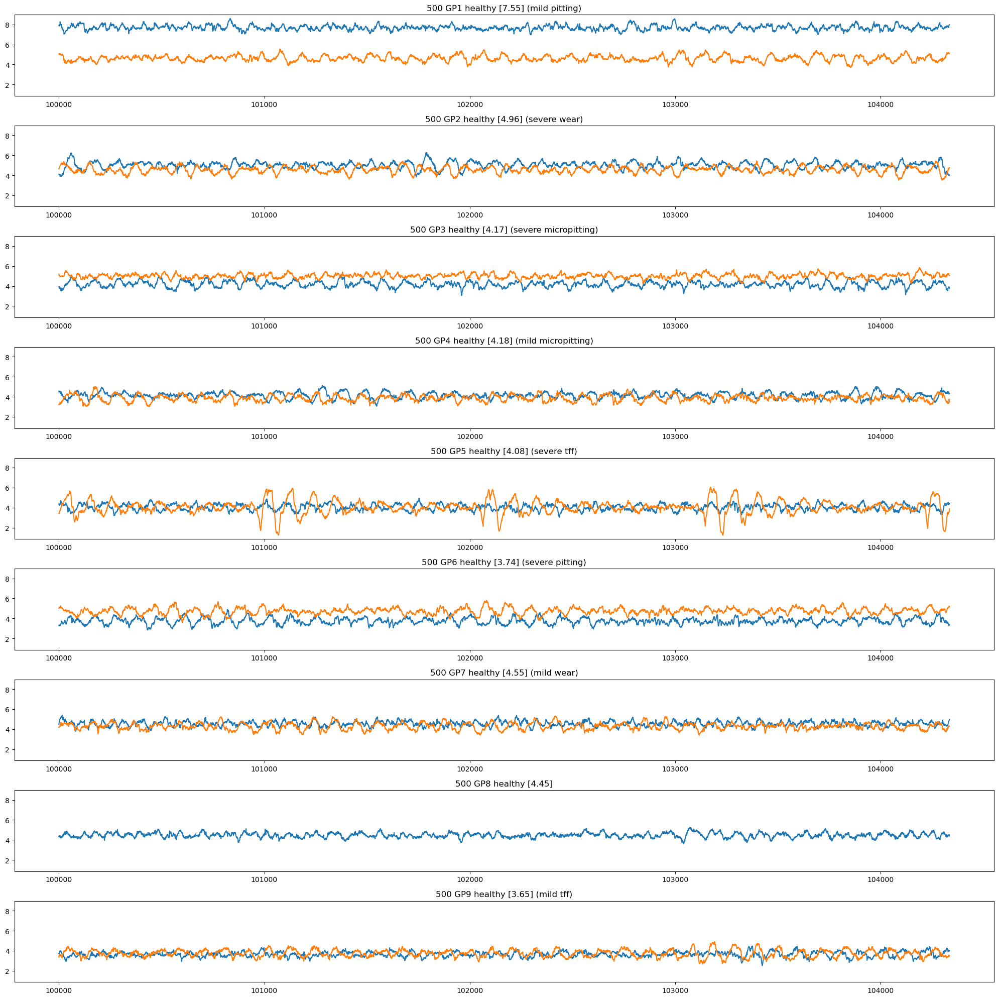

In [15]:
sensor = "Torq1"
offset = 100000

fig, axs = plt.subplots(9, 1, figsize=(20, 20), sharey=True)
axs = axs.flatten()

axs[0].plot(df_GP1[sensor].iloc[offset : offset + 1084 * 4])
axs[0].set_title("500 GP1 healthy [{:.2f}] (mild pitting)".format(df_GP1[sensor].mean()))
axs[0].plot(df_GP1_mild_pitting[sensor].iloc[offset : offset + 1084 * 4])


axs[1].plot(df_GP2[sensor].iloc[offset : offset + 1084 * 4])
axs[1].set_title("500 GP2 healthy [{:.2f}] (severe wear)".format(df_GP2[sensor].mean()))
axs[1].plot(df_GP2_severe_wear[sensor].iloc[offset : offset + 1084 * 4])

axs[2].plot(df_GP3[sensor].iloc[offset : offset + 1084 * 4])
axs[2].set_title("500 GP3 healthy [{:.2f}] (severe micropitting)".format(df_GP3[sensor].mean()))
axs[2].plot(df_GP3_severe_micropitting[sensor].iloc[offset : offset + 1084 * 4])

axs[3].plot(df_GP4[sensor].iloc[offset : offset + 1084 * 4])
axs[3].set_title("500 GP4 healthy [{:.2f}] (mild micropitting)".format(df_GP4[sensor].mean()))
axs[3].plot(df_GP4_mild_micropitting[sensor].iloc[offset : offset + 1084 * 4])

axs[4].plot(df_GP5[sensor].iloc[offset : offset + 1084 * 4])
axs[4].set_title("500 GP5 healthy [{:.2f}] (severe tff)".format(df_GP5[sensor].mean()))
axs[4].plot(df_GP5_severe_tff[sensor].iloc[offset : offset + 1084 * 4])

axs[5].plot(df_GP6[sensor].iloc[offset : offset + 1084 * 4])
axs[5].set_title("500 GP6 healthy [{:.2f}] (severe pitting)".format(df_GP6[sensor].mean()))
axs[5].plot(df_GP6_severe_pitting[sensor].iloc[offset : offset + 1084 * 4])

axs[6].plot(df_GP7[sensor].iloc[offset : offset + 1084 * 4])
axs[6].set_title("500 GP7 healthy [{:.2f}] (mild wear)".format(df_GP7[sensor].mean()))
axs[6].plot(df_GP7_mild_wear[sensor].iloc[offset : offset + 1084 * 4])

axs[7].plot(df_GP8[sensor].iloc[offset : offset + 1084 * 4])
axs[7].set_title("500 GP8 healthy [{:.2f}]".format(df_GP8[sensor].mean()))

axs[8].plot(df_GP9[sensor].iloc[offset : offset + 1084 * 4])
axs[8].set_title("500 GP9 healthy [{:.2f}] (mild tff)".format(df_GP9[sensor].mean()))
axs[8].plot(df_GP9_mild_tff[sensor].iloc[offset : offset + 1084 * 4])

# for i in range(3):
#     axs[i].vlines(offset + 1084, 7, 9, color="r")
#     axs[i].vlines(offset + 1084 * 2, 7, 9, color="r")
#     axs[i].vlines(offset + 1084 * 3, 7, 9, color="r")

plt.tight_layout()


### 1000


In [166]:
data_folder = os.path.join("data", "RAW", "ARotor_replication")

df_GP1 = pd.read_feather(
    # os.path.join(data_folder, "Baseline", "GP1", "3012Hz", "sensor", "500rpm_CT_baseline_11%_GP1_0_0,15_0,85.feather")
    # os.path.join(data_folder, "Baseline", "GP1", "3012Hz", "sensor", "500rpm_CT_baseline_6%_GP1_0_0,17_0,83.feather")
    os.path.join(data_folder, "Baseline", "GP1", "3012Hz", "sensor", "1000rpm_CT_baseline_1%_GP1_0_0,2_0,79.feather")
)
df_GP1 = df_GP1.iloc[int(len(df_GP1) * 0.25) : int(len(df_GP1) * 0.75)].reset_index(drop=True)

df_GP2 = pd.read_feather(
    # os.path.join(data_folder, "Baseline", "GP2", "3012Hz", "sensor", "1000rpm_CT_baseline_6%_GP2_0_0,17_0,83.feather")
    os.path.join(data_folder, "Baseline", "GP2", "3012Hz", "sensor", "1000rpm_CT_baseline_1%_GP2_0_0,22_0,78.feather")
)
df_GP2 = df_GP2.iloc[int(len(df_GP2) * 0.25) : int(len(df_GP2) * 0.75)].reset_index(drop=True)

df_GP3 = pd.read_feather(
    # os.path.join(data_folder, "Baseline", "GP3", "3012Hz", "sensor", "1000rpm_CT_baseline_6%_GP3_0_0,17_0,83.feather")
    os.path.join(data_folder, "Baseline", "GP3", "3012Hz", "sensor", "1000rpm_CT_baseline_1%_GP3_0_0,2_0,78.feather")
)
df_GP3 = df_GP3.iloc[int(len(df_GP3) * 0.25) : int(len(df_GP3) * 0.75)].reset_index(drop=True)

df_GP4 = pd.read_feather(
    os.path.join(data_folder, "Baseline", "GP4", "3012Hz", "sensor", "1000rpm_CT_baseline_1%_GP4_0_0,2_0,78.feather")
)
df_GP4 = df_GP4.iloc[int(len(df_GP4) * 0.25) : int(len(df_GP4) * 0.75)].reset_index(drop=True)

df_GP5 = pd.read_feather(
    os.path.join(data_folder, "Baseline", "GP5", "3012Hz", "sensor", "1000rpm_CT_baseline_1%_GP5_0_0,2_0,77.feather")
)
df_GP5 = df_GP5.iloc[int(len(df_GP5) * 0.25) : int(len(df_GP5) * 0.75)].reset_index(drop=True)

df_GP6 = pd.read_feather(
    os.path.join(data_folder, "Baseline", "GP6", "3012Hz", "sensor", "1000rpm_CT_baseline_1%_GP6_0_0,2_0,79.feather")
)
df_GP6 = df_GP6.iloc[int(len(df_GP6) * 0.25) : int(len(df_GP6) * 0.75)].reset_index(drop=True)

df_GP7 = pd.read_feather(
    os.path.join(data_folder, "Baseline", "GP7", "3012Hz", "sensor", "1000rpm_CT_baseline_1%_GP7_0_0,23_0,77.feather")
)
df_GP7 = df_GP7.iloc[int(len(df_GP7) * 0.25) : int(len(df_GP7) * 0.75)].reset_index(drop=True)

df_GP8 = pd.read_feather(
    os.path.join(data_folder, "Baseline", "GP8", "3012Hz", "sensor", "1000rpm_CT_baseline_1%_GP8_0_0,2_0,78.feather")
)
df_GP8 = df_GP8.iloc[int(len(df_GP8) * 0.25) : int(len(df_GP8) * 0.75)].reset_index(drop=True)

df_GP9 = pd.read_feather(
    os.path.join(data_folder, "Baseline", "GP9", "3012Hz", "sensor", "1000rpm_CT_baseline_1%_GP9_0_0,2_0,78.feather")
)
df_GP9 = df_GP9.iloc[int(len(df_GP9) * 0.25) : int(len(df_GP9) * 0.75)].reset_index(drop=True)


In [62]:
df_GP1_mild_pitting = pd.read_feather(
    os.path.join(
        data_folder,
        "Faults",
        "GP1_mild_pitting",
        "data_set_1",
        "3012Hz",
        "sensor",
        "1000rpm_CT_failure_1%_GP1_0_0,2_0,8.feather",
    )
)
df_GP1_mild_pitting = df_GP1_mild_pitting.iloc[
    int(len(df_GP1_mild_pitting) * 0.25) : int(len(df_GP1_mild_pitting) * 0.75)
].reset_index(drop=True)

df_GP2_severe_wear = pd.read_feather(
    os.path.join(
        data_folder,
        "Faults",
        "GP2_severe_wear",
        "data_set_1",
        "3012Hz",
        "sensor",
        "1000rpm_CT_failure_1%_GP2_0_0,2_0,8.feather",
    )
)
df_GP2_severe_wear = df_GP2_severe_wear.iloc[
    int(len(df_GP2_severe_wear) * 0.25) : int(len(df_GP2_severe_wear) * 0.75)
].reset_index(drop=True)

df_GP3_severe_micropitting = pd.read_feather(
    os.path.join(
        data_folder,
        "Faults",
        "GP3_severe_micropitting",
        "data_set_1",
        "3012Hz",
        "sensor",
        "1000rpm_CT_failure_1%_GP3_0_0,2_0,8.feather",
    )
)
df_GP3_severe_micropitting = df_GP3_severe_micropitting.iloc[
    int(len(df_GP3_severe_micropitting) * 0.25) : int(len(df_GP3_severe_micropitting) * 0.75)
].reset_index(drop=True)

df_GP4_mild_micropitting = pd.read_feather(
    os.path.join(
        data_folder,
        "Faults",
        "GP4_mild_micropitting",
        "data_set_1",
        "3012Hz",
        "sensor",
        "1000rpm_CT_failure_1%_GP4_0_0,2_0,8.feather",
    )
)
df_GP4_mild_micropitting = df_GP4_mild_micropitting.iloc[
    int(len(df_GP4_mild_micropitting) * 0.25) : int(len(df_GP4_mild_micropitting) * 0.75)
].reset_index(drop=True)

df_GP5_severe_tff = pd.read_feather(
    os.path.join(
        data_folder,
        "Faults",
        "GP5_severe_tff",
        "data_set_1",
        "3012Hz",
        "sensor",
        "1000rpm_CT_failure_1%_GP5_0_0,2_0,8.feather",
    )
)
df_GP5_severe_tff = df_GP5_severe_tff.iloc[
    int(len(df_GP5_severe_tff) * 0.25) : int(len(df_GP5_severe_tff) * 0.75)
].reset_index(drop=True)

df_GP6_severe_pitting = pd.read_feather(
    os.path.join(
        data_folder,
        "Faults",
        "GP6_severe_pitting",
        "data_set_1",
        "3012Hz",
        "sensor",
        "1000rpm_CT_failure_1%_GP6_0_0,2_0,8.feather",
    )
)
df_GP6_severe_pitting = df_GP6_severe_pitting.iloc[
    int(len(df_GP6_severe_pitting) * 0.25) : int(len(df_GP6_severe_pitting) * 0.75)
].reset_index(drop=True)

df_GP7_mild_wear = pd.read_feather(
    os.path.join(
        data_folder,
        "Faults",
        "GP7_mild_wear",
        "data_set_1",
        "3012Hz",
        "sensor",
        "1000rpm_CT_failure_1%_GP7_0_0,2_0,8.feather",
    )
)
df_GP7_mild_wear = df_GP7_mild_wear.iloc[
    int(len(df_GP7_mild_wear) * 0.25) : int(len(df_GP7_mild_wear) * 0.75)
].reset_index(drop=True)

df_GP9_mild_tff = pd.read_feather(
    os.path.join(
        data_folder,
        "Faults",
        "GP9_mild_tff",
        "data_set_1",
        "3012Hz",
        "sensor",
        "1000rpm_CT_failure_1%_GP9_0_0,2_0,8.feather",
    )
)
df_GP9_mild_tff = df_GP9_mild_tff.iloc[int(len(df_GP9_mild_tff) * 0.25) : int(len(df_GP9_mild_tff) * 0.75)].reset_index(
    drop=True
)


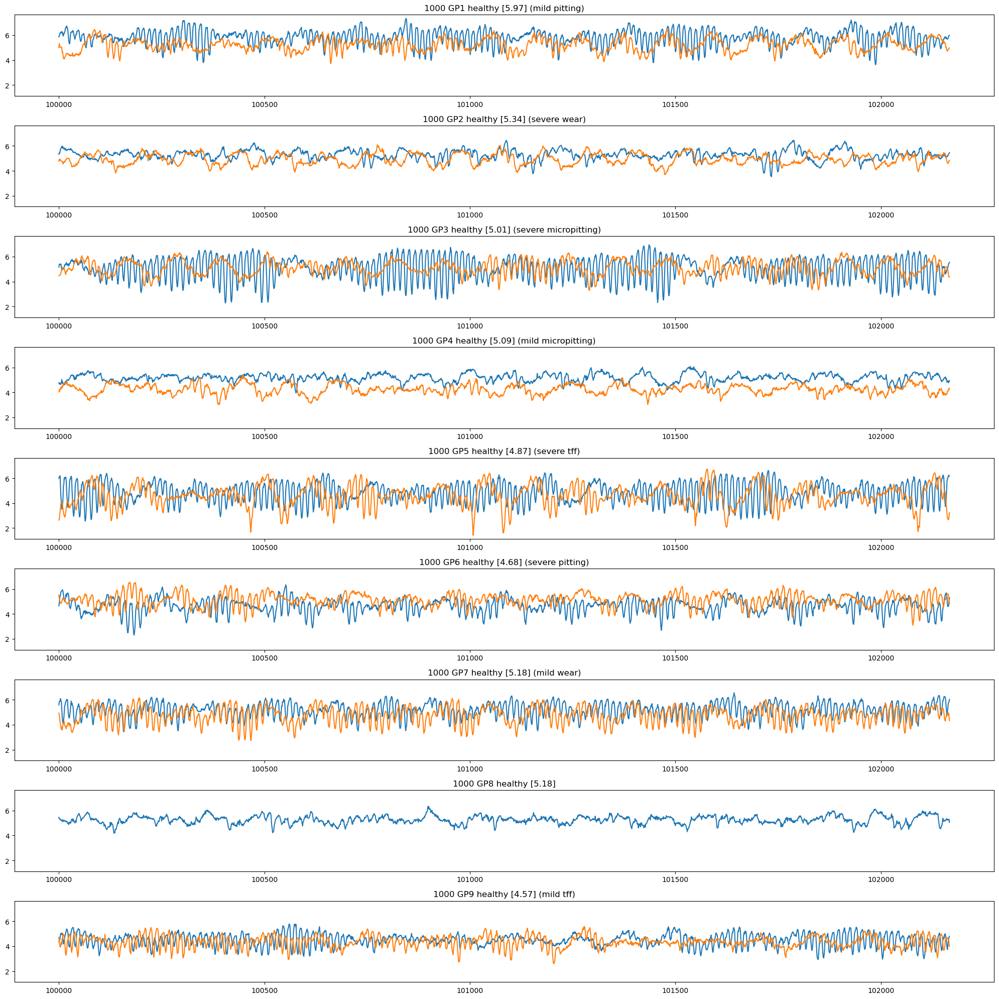

In [131]:
sensor = "Torq1"
offset = 100000

fig, axs = plt.subplots(9, 1, figsize=(20, 20), sharey=True)
axs = axs.flatten()

axs[0].plot(df_GP1[sensor].iloc[offset : offset + 542 * 4])
axs[0].set_title("1000 GP1 healthy [{:.2f}] (mild pitting)".format(df_GP1[sensor].mean()))
axs[0].plot(df_GP1_mild_pitting[sensor].iloc[offset : offset + 542 * 4])


axs[1].plot(df_GP2[sensor].iloc[offset : offset + 542 * 4])
axs[1].set_title("1000 GP2 healthy [{:.2f}] (severe wear)".format(df_GP2[sensor].mean()))
axs[1].plot(df_GP2_severe_wear[sensor].iloc[offset : offset + 542 * 4])

axs[2].plot(df_GP3[sensor].iloc[offset : offset + 542 * 4])
axs[2].set_title("1000 GP3 healthy [{:.2f}] (severe micropitting)".format(df_GP3[sensor].mean()))
axs[2].plot(df_GP3_severe_micropitting[sensor].iloc[offset : offset + 542 * 4])

axs[3].plot(df_GP4[sensor].iloc[offset : offset + 542 * 4])
axs[3].set_title("1000 GP4 healthy [{:.2f}] (mild micropitting)".format(df_GP4[sensor].mean()))
axs[3].plot(df_GP4_mild_micropitting[sensor].iloc[offset : offset + 542 * 4])

axs[4].plot(df_GP5[sensor].iloc[offset : offset + 542 * 4])
axs[4].set_title("1000 GP5 healthy [{:.2f}] (severe tff)".format(df_GP5[sensor].mean()))
axs[4].plot(df_GP5_severe_tff[sensor].iloc[offset : offset + 542 * 4])

axs[5].plot(df_GP6[sensor].iloc[offset : offset + 542 * 4])
axs[5].set_title("1000 GP6 healthy [{:.2f}] (severe pitting)".format(df_GP6[sensor].mean()))
axs[5].plot(df_GP6_severe_pitting[sensor].iloc[offset : offset + 542 * 4])

axs[6].plot(df_GP7[sensor].iloc[offset : offset + 542 * 4])
axs[6].set_title("1000 GP7 healthy [{:.2f}] (mild wear)".format(df_GP7[sensor].mean()))
axs[6].plot(df_GP7_mild_wear[sensor].iloc[offset : offset + 542 * 4])

axs[7].plot(df_GP8[sensor].iloc[offset : offset + 542 * 4])
axs[7].set_title("1000 GP8 healthy [{:.2f}]".format(df_GP8[sensor].mean()))

axs[8].plot(df_GP9[sensor].iloc[offset : offset + 542 * 4])
axs[8].set_title("1000 GP9 healthy [{:.2f}] (mild tff)".format(df_GP9[sensor].mean()))
axs[8].plot(df_GP9_mild_tff[sensor].iloc[offset : offset + 542 * 4])

# for i in range(3):
#     axs[i].vlines(offset + 542, 7, 9, color="r")
#     axs[i].vlines(offset + 542 * 2, 7, 9, color="r")
#     axs[i].vlines(offset + 542 * 3, 7, 9, color="r")

plt.tight_layout()


### 1500


In [21]:
data_folder = os.path.join("data", "RAW", "ARotor_replication")

df_GP1 = pd.read_feather(
    # os.path.join(data_folder, "Baseline", "GP1", "3012Hz", "sensor", "500rpm_CT_baseline_16%_GP1_0_0,15_0,85.feather")
    # os.path.join(data_folder, "Baseline", "GP1", "3012Hz", "sensor", "500rpm_CT_baseline_6%_GP1_0_0,17_0,83.feather")
    os.path.join(data_folder, "Baseline", "GP1", "3012Hz", "sensor", "1500rpm_CT_baseline_6%_GP1_0_0,25_0,74.feather")
)
df_GP1 = df_GP1.iloc[int(len(df_GP1) * 0.25) : int(len(df_GP1) * 0.75)].reset_index(drop=True)

df_GP2 = pd.read_feather(
    # os.path.join(data_folder, "Baseline", "GP2", "3012Hz", "sensor", "1500rpm_CT_baseline_6%_GP2_0_0,17_0,83.feather")
    os.path.join(data_folder, "Baseline", "GP2", "3012Hz", "sensor", "1500rpm_CT_baseline_6%_GP2_0_0,25_0,73.feather")
)
df_GP2 = df_GP2.iloc[int(len(df_GP2) * 0.25) : int(len(df_GP2) * 0.75)].reset_index(drop=True)

df_GP3 = pd.read_feather(
    # os.path.join(data_folder, "Baseline", "GP3", "3012Hz", "sensor", "1500rpm_CT_baseline_6%_GP3_0_0,17_0,83.feather")
    os.path.join(data_folder, "Baseline", "GP3", "3012Hz", "sensor", "1500rpm_CT_baseline_6%_GP3_0_0,25_0,74.feather")
)
df_GP3 = df_GP3.iloc[int(len(df_GP3) * 0.25) : int(len(df_GP3) * 0.75)].reset_index(drop=True)

df_GP4 = pd.read_feather(
    os.path.join(data_folder, "Baseline", "GP4", "3012Hz", "sensor", "1500rpm_CT_baseline_6%_GP4_0_0,25_0,74.feather")
)
df_GP4 = df_GP4.iloc[int(len(df_GP4) * 0.25) : int(len(df_GP4) * 0.75)].reset_index(drop=True)

df_GP5 = pd.read_feather(
    os.path.join(data_folder, "Baseline", "GP5", "3012Hz", "sensor", "1500rpm_CT_baseline_6%_GP5_0_0,25_0,74.feather")
)
df_GP5 = df_GP5.iloc[int(len(df_GP5) * 0.25) : int(len(df_GP5) * 0.75)].reset_index(drop=True)

df_GP6 = pd.read_feather(
    os.path.join(data_folder, "Baseline", "GP6", "3012Hz", "sensor", "1500rpm_CT_baseline_6%_GP6_0_0,25_0,74.feather")
)
df_GP6 = df_GP6.iloc[int(len(df_GP6) * 0.25) : int(len(df_GP6) * 0.75)].reset_index(drop=True)

df_GP7 = pd.read_feather(
    os.path.join(data_folder, "Baseline", "GP7", "3012Hz", "sensor", "1500rpm_CT_baseline_6%_GP7_0_0,25_0,74.feather")
)
df_GP7 = df_GP7.iloc[int(len(df_GP7) * 0.25) : int(len(df_GP7) * 0.75)].reset_index(drop=True)

df_GP8 = pd.read_feather(
    os.path.join(data_folder, "Baseline", "GP8", "3012Hz", "sensor", "1500rpm_CT_baseline_6%_GP8_0_0,25_0,74.feather")
)
df_GP8 = df_GP8.iloc[int(len(df_GP8) * 0.25) : int(len(df_GP8) * 0.75)].reset_index(drop=True)

df_GP9 = pd.read_feather(
    os.path.join(data_folder, "Baseline", "GP9", "3012Hz", "sensor", "1500rpm_CT_baseline_6%_GP9_0_0,25_0,74.feather")
)
df_GP9 = df_GP9.iloc[int(len(df_GP9) * 0.25) : int(len(df_GP9) * 0.75)].reset_index(drop=True)


In [22]:
df_GP1_mild_pitting = pd.read_feather(
    os.path.join(
        data_folder,
        "Faults",
        "GP1_mild_pitting",
        "data_set_2",
        "3012Hz",
        "sensor",
        "1500rpm_CT_failure_6%_GP1_0.feather",
    )
)
df_GP1_mild_pitting = df_GP1_mild_pitting.iloc[
    int(len(df_GP1_mild_pitting) * 0.25) : int(len(df_GP1_mild_pitting) * 0.75)
].reset_index(drop=True)

df_GP2_severe_wear = pd.read_feather(
    os.path.join(
        data_folder,
        "Faults",
        "GP2_severe_wear",
        "data_set_2",
        "3012Hz",
        "sensor",
        "1500rpm_CT_failure_6%_GP2_0.feather",
    )
)
df_GP2_severe_wear = df_GP2_severe_wear.iloc[
    int(len(df_GP2_severe_wear) * 0.25) : int(len(df_GP2_severe_wear) * 0.75)
].reset_index(drop=True)

df_GP3_severe_micropitting = pd.read_feather(
    os.path.join(
        data_folder,
        "Faults",
        "GP3_severe_micropitting",
        "data_set_2",
        "3012Hz",
        "sensor",
        "1500rpm_CT_failure_6%_GP3_0.feather",
    )
)
df_GP3_severe_micropitting = df_GP3_severe_micropitting.iloc[
    int(len(df_GP3_severe_micropitting) * 0.25) : int(len(df_GP3_severe_micropitting) * 0.75)
].reset_index(drop=True)

df_GP4_mild_micropitting = pd.read_feather(
    os.path.join(
        data_folder,
        "Faults",
        "GP4_mild_micropitting",
        "data_set_2",
        "3012Hz",
        "sensor",
        "1500rpm_CT_failure_6%_GP4_0.feather",
    )
)
df_GP4_mild_micropitting = df_GP4_mild_micropitting.iloc[
    int(len(df_GP4_mild_micropitting) * 0.25) : int(len(df_GP4_mild_micropitting) * 0.75)
].reset_index(drop=True)

df_GP5_severe_tff = pd.read_feather(
    os.path.join(
        data_folder,
        "Faults",
        "GP5_severe_tff",
        "data_set_2",
        "3012Hz",
        "sensor",
        "1500rpm_CT_failure_6%_GP5_0.feather",
    )
)
df_GP5_severe_tff = df_GP5_severe_tff.iloc[
    int(len(df_GP5_severe_tff) * 0.25) : int(len(df_GP5_severe_tff) * 0.75)
].reset_index(drop=True)

df_GP6_severe_pitting = pd.read_feather(
    os.path.join(
        data_folder,
        "Faults",
        "GP6_severe_pitting",
        "data_set_2",
        "3012Hz",
        "sensor",
        "1500rpm_CT_failure_6%_GP6_0.feather",
    )
)
df_GP6_severe_pitting = df_GP6_severe_pitting.iloc[
    int(len(df_GP6_severe_pitting) * 0.25) : int(len(df_GP6_severe_pitting) * 0.75)
].reset_index(drop=True)

df_GP7_mild_wear = pd.read_feather(
    os.path.join(
        data_folder,
        "Faults",
        "GP7_mild_wear",
        "data_set_2",
        "3012Hz",
        "sensor",
        "1500rpm_CT_failure_6%_GP7_0.feather",
    )
)
df_GP7_mild_wear = df_GP7_mild_wear.iloc[
    int(len(df_GP7_mild_wear) * 0.25) : int(len(df_GP7_mild_wear) * 0.75)
].reset_index(drop=True)

df_GP9_mild_tff = pd.read_feather(
    os.path.join(
        data_folder,
        "Faults",
        "GP9_mild_tff",
        "data_set_2",
        "3012Hz",
        "sensor",
        "1500rpm_CT_failure_6%_GP9_0.feather",
    )
)
df_GP9_mild_tff = df_GP9_mild_tff.iloc[int(len(df_GP9_mild_tff) * 0.25) : int(len(df_GP9_mild_tff) * 0.75)].reset_index(
    drop=True
)


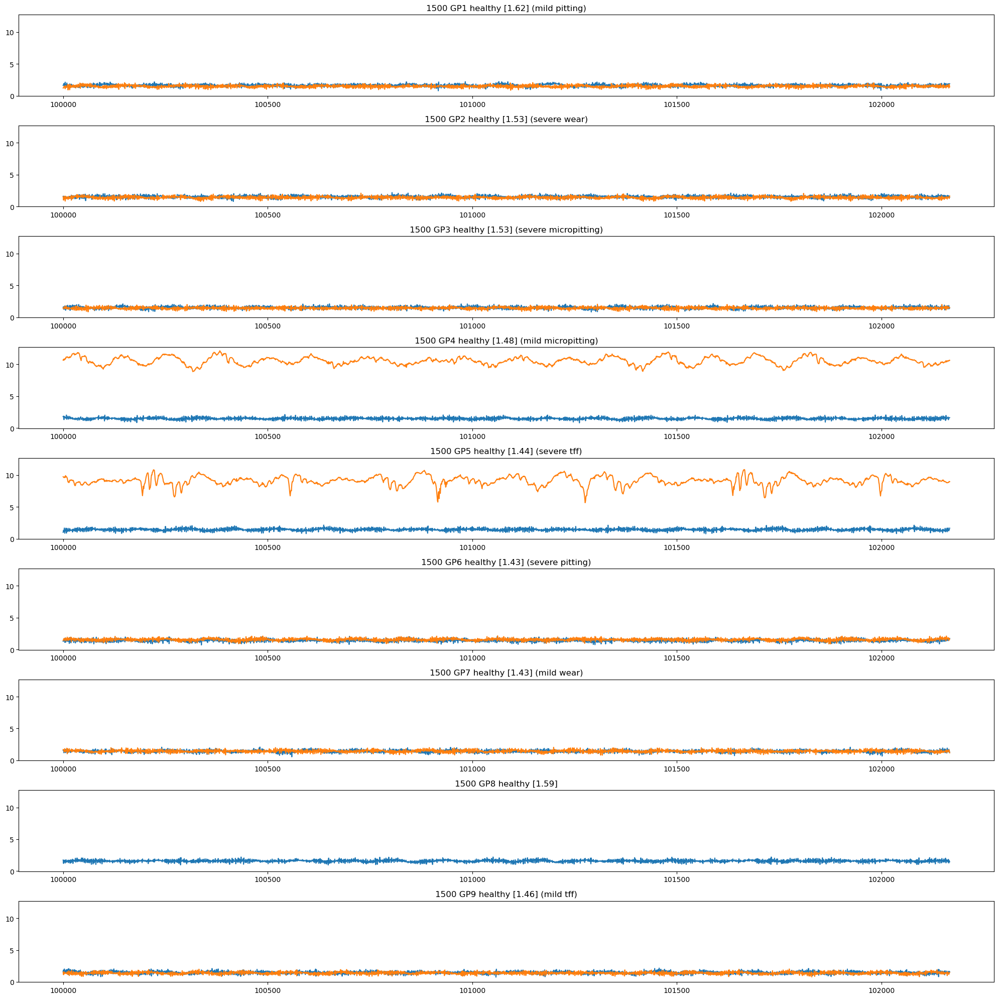

In [33]:
sensor = "Torq2"
offset = 100000

fig, axs = plt.subplots(9, 1, figsize=(20, 20), sharey=True)
axs = axs.flatten()

axs[0].plot(df_GP1[sensor].iloc[offset : offset + 542 * 4])
axs[0].set_title("1500 GP1 healthy [{:.2f}] (mild pitting)".format(df_GP1[sensor].mean()))
axs[0].plot(df_GP1_mild_pitting[sensor].iloc[offset : offset + 542 * 4])


axs[1].plot(df_GP2[sensor].iloc[offset : offset + 542 * 4])
axs[1].set_title("1500 GP2 healthy [{:.2f}] (severe wear)".format(df_GP2[sensor].mean()))
axs[1].plot(df_GP2_severe_wear[sensor].iloc[offset : offset + 542 * 4])

axs[2].plot(df_GP3[sensor].iloc[offset : offset + 542 * 4])
axs[2].set_title("1500 GP3 healthy [{:.2f}] (severe micropitting)".format(df_GP3[sensor].mean()))
axs[2].plot(df_GP3_severe_micropitting[sensor].iloc[offset : offset + 542 * 4])

axs[3].plot(df_GP4[sensor].iloc[offset : offset + 542 * 4])
axs[3].set_title("1500 GP4 healthy [{:.2f}] (mild micropitting)".format(df_GP4[sensor].mean()))
axs[3].plot(df_GP4_mild_micropitting[sensor].iloc[offset : offset + 542 * 4])

axs[4].plot(df_GP5[sensor].iloc[offset : offset + 542 * 4])
axs[4].set_title("1500 GP5 healthy [{:.2f}] (severe tff)".format(df_GP5[sensor].mean()))
axs[4].plot(df_GP5_severe_tff[sensor].iloc[offset : offset + 542 * 4])

axs[5].plot(df_GP6[sensor].iloc[offset : offset + 542 * 4])
axs[5].set_title("1500 GP6 healthy [{:.2f}] (severe pitting)".format(df_GP6[sensor].mean()))
axs[5].plot(df_GP6_severe_pitting[sensor].iloc[offset : offset + 542 * 4])

axs[6].plot(df_GP7[sensor].iloc[offset : offset + 542 * 4])
axs[6].set_title("1500 GP7 healthy [{:.2f}] (mild wear)".format(df_GP7[sensor].mean()))
axs[6].plot(df_GP7_mild_wear[sensor].iloc[offset : offset + 542 * 4])

axs[7].plot(df_GP8[sensor].iloc[offset : offset + 542 * 4])
axs[7].set_title("1500 GP8 healthy [{:.2f}]".format(df_GP8[sensor].mean()))

axs[8].plot(df_GP9[sensor].iloc[offset : offset + 542 * 4])
axs[8].set_title("1500 GP9 healthy [{:.2f}] (mild tff)".format(df_GP9[sensor].mean()))
axs[8].plot(df_GP9_mild_tff[sensor].iloc[offset : offset + 542 * 4])

# for i in range(3):
#     axs[i].vlines(offset + 542, 7, 9, color="r")
#     axs[i].vlines(offset + 542 * 2, 7, 9, color="r")
#     axs[i].vlines(offset + 542 * 3, 7, 9, color="r")

plt.tight_layout()


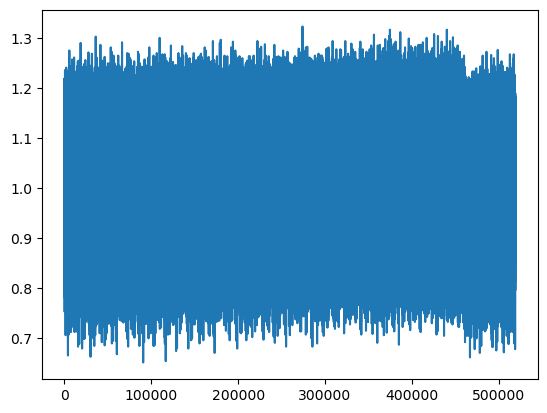

In [49]:
dataset = ds.dataset(
    os.path.join("data", "processed", "arotor_replication_faults_ds"), format="feather", partitioning="hive"
)

selected_data = dataset.to_table(
    columns=["torque1", "torque2"] + ["fault", "severity", "rpm", "torque"],
    filter=(
        ds.field("rpm").isin([500])
        & ds.field("installation").isin([1])
        & ds.field("severity").isin(["severe"])
        & ds.field("torque").isin([1])
        & ds.field("fault").isin(["micropitting"])
    ),
).to_pandas()

plt.plot(selected_data["torque1"])


### Something


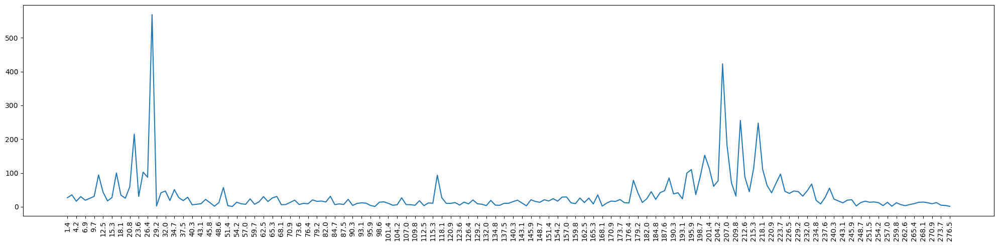

In [132]:
plt.figure(figsize=(20, 5))
plt.plot(np.abs(np.fft.rfft(df_GP7_mild_wear[sensor].iloc[offset : offset + 542 * 4]))[1:200])
plt.xticks(range(0, 199, 2), np.round(np.fft.fftfreq(542 * 4, 1 / 3012)[1:200:2], 1), rotation=90)
plt.tight_layout()
plt.show()


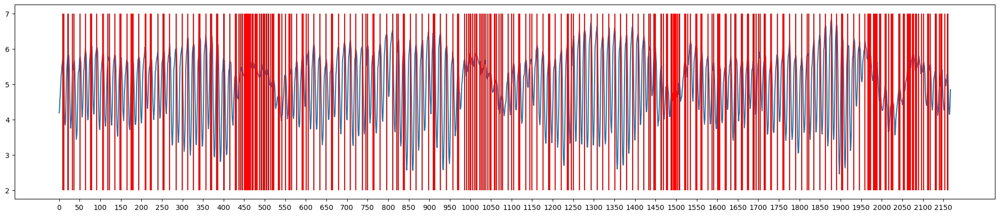

In [173]:
s = df_GP3[sensor].iloc[: 542 * 4]
peaks = scipy.signal.find_peaks(s)[0]

plt.figure(figsize=(25, 5))
plt.plot(s)
_ = plt.vlines(peaks, 2, 7, color="r")
# _ = plt.xticks(range(0, 542 * 4, 50), np.round(np.array(range(0, 542 * 4, 50)) * 1/3012, 2))
_ = plt.xticks(range(0, 542 * 4, 50), np.array(range(0, 542 * 4, 50)))


In [174]:
tmp = peaks[(peaks > 1270) & (peaks < 1420)]
print(tmp)
d = np.diff(tmp).mean()
print(d)
f = 1 / (d * (1 / 3012))
print(f)
print(f / (1000 / 60 / 3))


[1278 1293 1308 1322 1337 1351 1365 1380 1394 1408]
14.444444444444445
208.52307692307693
37.53415384615384


[  4   8  25  41  44  63  66  70  75  83  86 103 119 121 127 129 131 133
 136 141 143 146 148 150 153 156 159 163 165 167 169 173 177 179 186 192
 194 196 198]


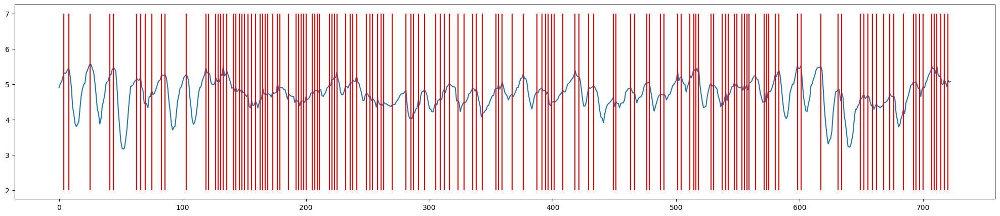

In [155]:
plt.figure(figsize=(25, 5))
df_GP7_mild_wear_1250 = pd.read_feather(
    os.path.join(
        data_folder,
        "Faults",
        "GP7_mild_wear",
        "data_set_1",
        "3012Hz",
        "sensor",
        "750rpm_CT_failure_1%_GP7_0_0,2_0,8.feather",
    )
)
df_GP7_mild_wear_1250 = df_GP7_mild_wear_1250.iloc[
    int(len(df_GP7_mild_wear_1250) * 0.25) : int(len(df_GP7_mild_wear_1250) * 0.75)
].reset_index(drop=True)

s = df_GP7_mild_wear_1250["Torq1"][:723]
peaks = scipy.signal.find_peaks(s)[0]
print(peaks[peaks < 200])

plt.plot(s)
_ = plt.vlines(peaks, 2, 7, color="r")
# _ = plt.xticks(range(0, 542 * 4, 50), np.round(np.array(range(0, 542 * 4, 50)) * 1/3012, 2))


In [160]:
filtered_peaks = [8, 25, 44, 66, 86, 103, 119]
d = np.diff(filtered_peaks).mean()
f = 1 / (d * (1 / 3012))
print(f)
print(f / (750 / 60 / 3))


162.8108108108108
39.07459459459459


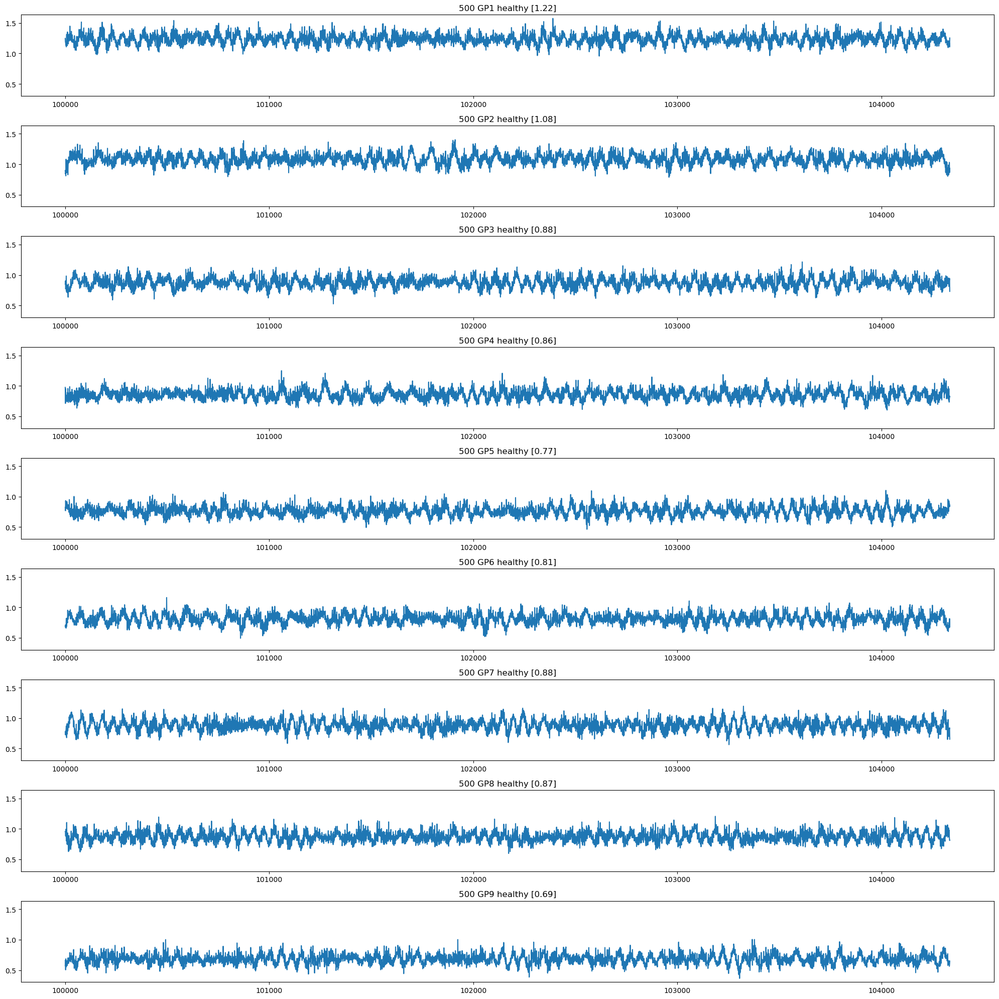

In [59]:
sensor = "Torq2"
offset = 100000

fig, axs = plt.subplots(9, 1, figsize=(20, 20), sharey=True)
axs = axs.flatten()

axs[0].plot(df_GP1[sensor].iloc[offset : offset + 1084 * 4])
axs[0].set_title("500 GP1 healthy [{:.2f}]".format(df_GP1[sensor].mean()))

axs[1].plot(df_GP2[sensor].iloc[offset : offset + 1084 * 4])
axs[1].set_title("500 GP2 healthy [{:.2f}]".format(df_GP2[sensor].mean()))

axs[2].plot(df_GP3[sensor].iloc[offset : offset + 1084 * 4])
axs[2].set_title("500 GP3 healthy [{:.2f}]".format(df_GP3[sensor].mean()))

axs[3].plot(df_GP4[sensor].iloc[offset : offset + 1084 * 4])
axs[3].set_title("500 GP4 healthy [{:.2f}]".format(df_GP4[sensor].mean()))

axs[4].plot(df_GP5[sensor].iloc[offset : offset + 1084 * 4])
axs[4].set_title("500 GP5 healthy [{:.2f}]".format(df_GP5[sensor].mean()))

axs[5].plot(df_GP6[sensor].iloc[offset : offset + 1084 * 4])
axs[5].set_title("500 GP6 healthy [{:.2f}]".format(df_GP6[sensor].mean()))

axs[6].plot(df_GP7[sensor].iloc[offset : offset + 1084 * 4])
axs[6].set_title("500 GP7 healthy [{:.2f}]".format(df_GP7[sensor].mean()))

axs[7].plot(df_GP8[sensor].iloc[offset : offset + 1084 * 4])
axs[7].set_title("500 GP8 healthy [{:.2f}]".format(df_GP8[sensor].mean()))

axs[8].plot(df_GP9[sensor].iloc[offset : offset + 1084 * 4])
axs[8].set_title("500 GP9 healthy [{:.2f}]".format(df_GP9[sensor].mean()))

# for i in range(3):
#     axs[i].vlines(offset + 1084, 7, 9, color="r")
#     axs[i].vlines(offset + 1084 * 2, 7, 9, color="r")
#     axs[i].vlines(offset + 1084 * 3, 7, 9, color="r")

plt.tight_layout()


In [15]:
df_arotor = pd.read_feather(os.path.join("data", "processed", "arotor.feather"))
df_arotor = df_arotor.groupby(["class", "rpm"])
df_arotor = df_arotor.get_group((0, 500))
df_arotor


,acc1,acc2,acc3,acc4,torque1,torque2,en1speed,en1acc,en1speed_grad,en1acc_grad,...,en4speed,en4acc,en4speed_grad,en4acc_grad,en5speed,en5acc,en5speed_grad,en5acc_grad,rpm,class
26179884,0.644896,0.379498,0.578659,-5.106649,0.529907,2.779541,3018.292725,-96469.835938,3018.292725,-47980.746094,...,987.278137,16433.123047,987.278137,8016.857910,244.216812,-11.238976,244.216812,-6.243698,500,0
26179885,-0.347259,-0.519644,0.659603,-3.925325,0.665283,2.703857,2986.650635,71355.437500,3002.554932,-30325.767578,...,992.671082,-3376.102539,989.909058,7171.571289,244.212662,4590.852051,244.214508,1130.773193,500,0
26179886,0.022397,-0.418361,-0.467253,0.156181,0.600098,2.817383,3010.303223,-17174.173828,2998.416992,7078.921875,...,991.507935,31814.816406,992.074097,10155.669922,245.566162,3584.032959,244.816071,2844.214355,500,0
26179887,0.476590,-0.378076,0.120836,5.366940,0.568237,2.855530,3004.552246,-33419.199219,3007.404541,618.588013,...,1001.904175,13304.222656,996.592651,18023.931641,246.879715,3771.077148,246.224686,3870.296631,500,0
26179888,0.527297,0.422665,0.181666,4.830567,0.632080,2.883911,2993.540771,65316.945312,2999.106201,-4546.670410,...,1006.445618,1700.414917,1004.241394,14825.117188,248.254456,5181.345703,247.645340,4183.127930,500,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
26631377,0.102537,-0.133878,0.188870,-0.335995,0.515869,2.596436,3014.157471,-47179.460938,3000.243896,24539.001953,...,1000.694946,-27437.244141,1002.000000,-8055.355469,250.609116,-3447.551270,251.321716,-3239.020996,500,0
26631378,-0.450713,-0.439467,0.321195,-3.576643,0.565674,2.612000,2998.661377,-28353.058594,3006.499023,-8948.579102,...,991.811462,-3749.602783,996.273010,-16589.283203,249.618637,-1771.636963,250.169876,-3301.575684,500,0
26631379,0.017457,-0.167034,-0.080570,-1.919215,0.606445,2.608948,2989.130371,36937.875000,2993.860596,-16531.457031,...,990.586548,11705.286133,991.215942,-5912.362305,248.979874,-880.166504,249.299667,-1894.139282,500,0
26631380,0.278458,0.393644,-0.226685,2.838622,0.670288,2.596436,3001.364258,6704.348145,2995.259766,13045.394531,...,994.627808,-20945.214844,992.665894,-232.201996,248.661713,-1687.260376,248.803223,-1298.091431,500,0


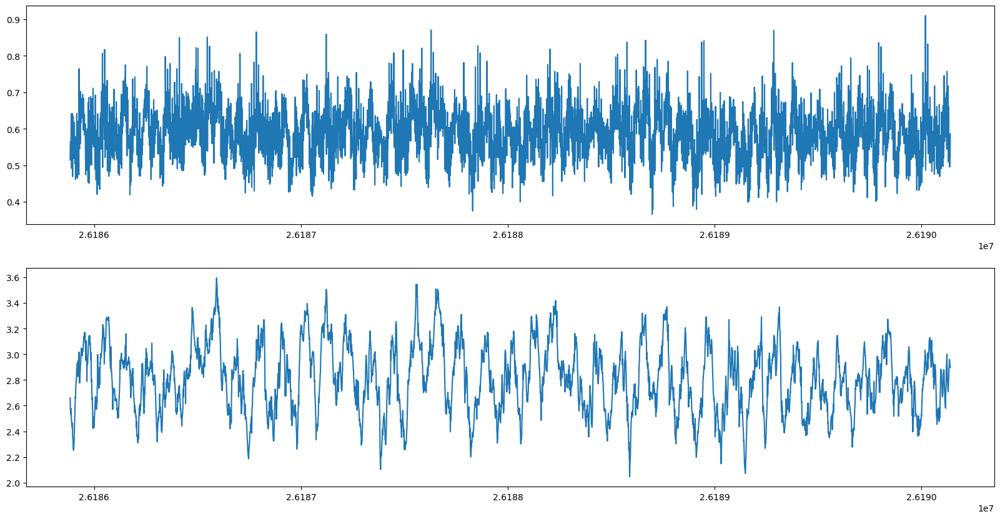

In [16]:
fig, axs = plt.subplots(2, 1, figsize=(20, 10))
axs = axs.flatten()

axs[0].plot(df_arotor["torque1"].iloc[6000 : 6000 + 1064 * 4])
axs[1].plot(df_arotor["torque2"].iloc[6000 : 6000 + 1064 * 4])


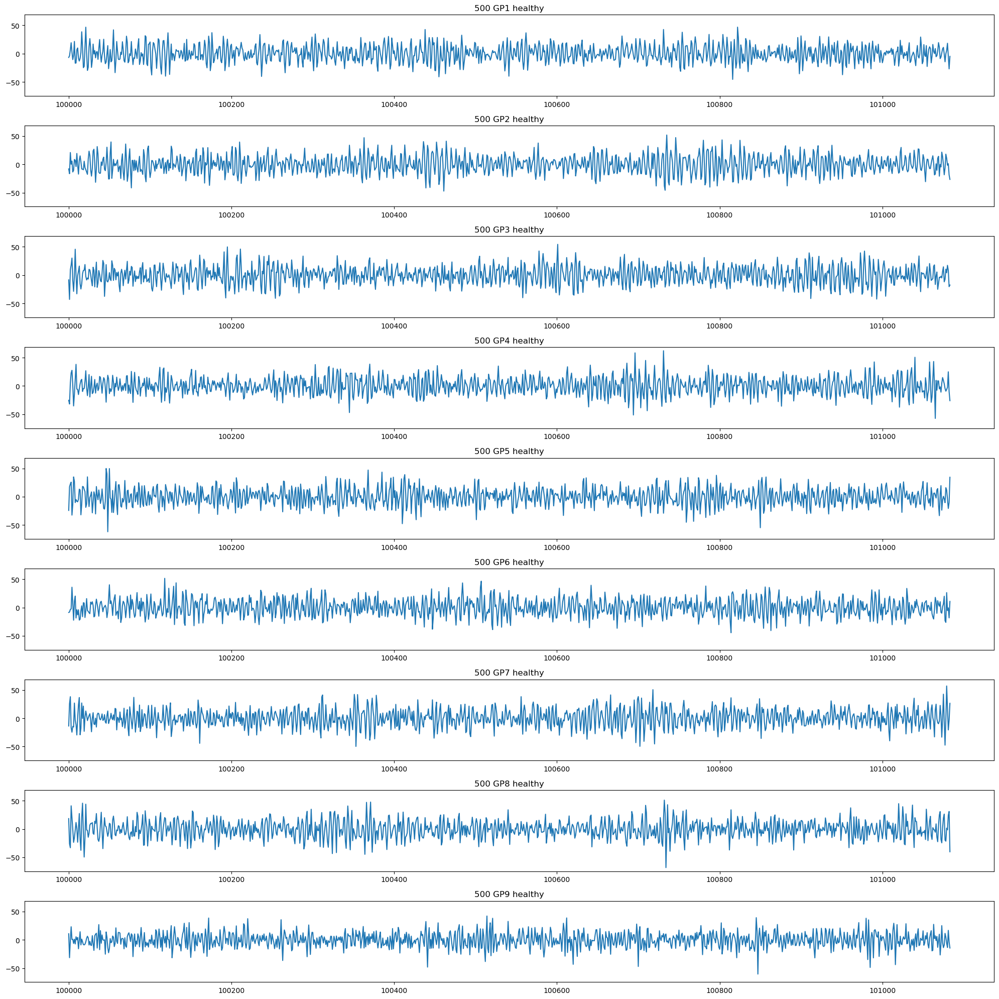

In [17]:
sensor = "acc1"
offset = 100000

fig, axs = plt.subplots(9, 1, figsize=(20, 20), sharey=True)
axs = axs.flatten()

axs[0].plot(df_GP1[sensor].iloc[offset : offset + 1084 * 1])
axs[0].set_title("500 GP1 healthy")

axs[1].plot(df_GP2[sensor].iloc[offset : offset + 1084 * 1])
axs[1].set_title("500 GP2 healthy")

axs[2].plot(df_GP3[sensor].iloc[offset : offset + 1084 * 1])
axs[2].set_title("500 GP3 healthy")

axs[3].plot(df_GP4[sensor].iloc[offset : offset + 1084 * 1])
axs[3].set_title("500 GP4 healthy")

axs[4].plot(df_GP5[sensor].iloc[offset : offset + 1084 * 1])
axs[4].set_title("500 GP5 healthy")

axs[5].plot(df_GP6[sensor].iloc[offset : offset + 1084 * 1])
axs[5].set_title("500 GP6 healthy")

axs[6].plot(df_GP7[sensor].iloc[offset : offset + 1084 * 1])
axs[6].set_title("500 GP7 healthy")

axs[7].plot(df_GP8[sensor].iloc[offset : offset + 1084 * 1])
axs[7].set_title("500 GP8 healthy")

axs[8].plot(df_GP9[sensor].iloc[offset : offset + 1084 * 1])
axs[8].set_title("500 GP9 healthy")

# for i in range(3):
#     axs[i].vlines(offset + 1084, 7, 9, color="r")
#     axs[i].vlines(offset + 1084 * 2, 7, 9, color="r")
#     axs[i].vlines(offset + 1084 * 3, 7, 9, color="r")

plt.tight_layout()


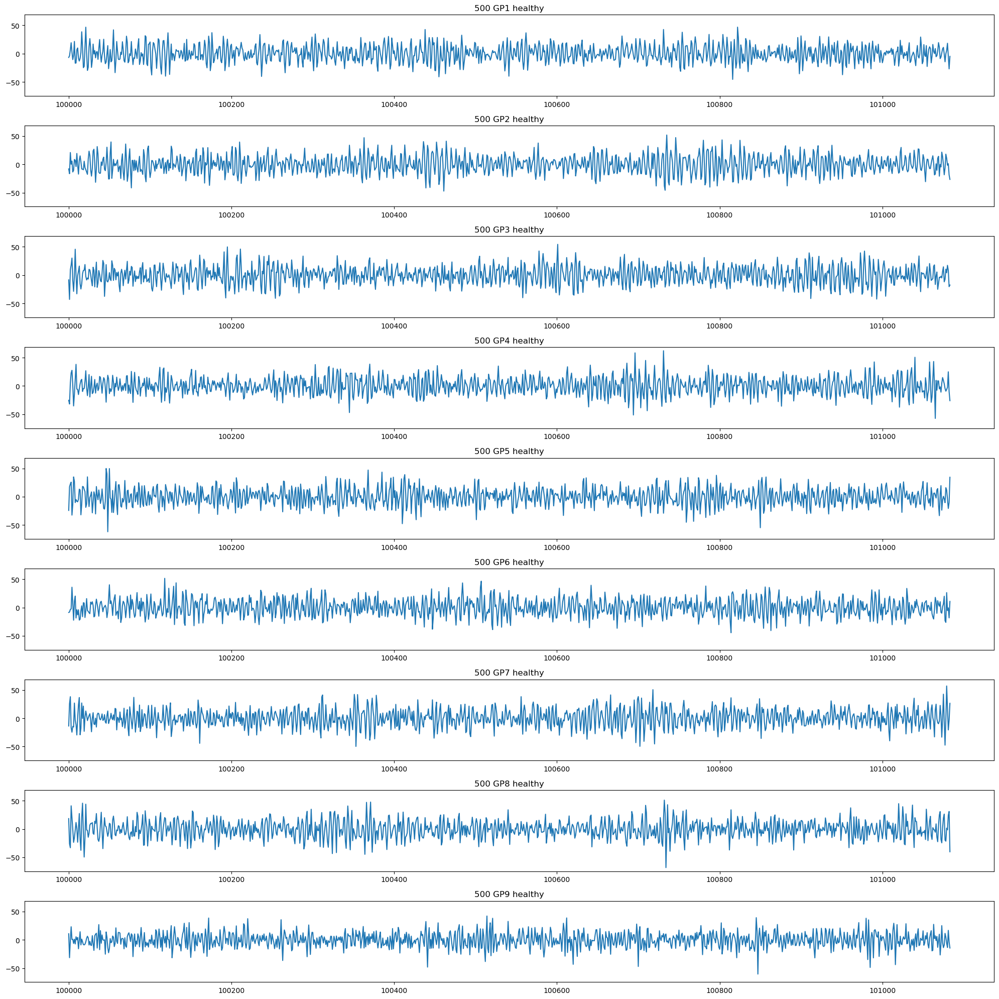

In [18]:
sensor = "acc1"
offset = 100000

fig, axs = plt.subplots(9, 1, figsize=(20, 20), sharey=True)
axs = axs.flatten()

axs[0].plot(df_GP1[sensor].iloc[offset : offset + 1084 * 1])
axs[0].set_title("500 GP1 healthy")

axs[1].plot(df_GP2[sensor].iloc[offset : offset + 1084 * 1])
axs[1].set_title("500 GP2 healthy")

axs[2].plot(df_GP3[sensor].iloc[offset : offset + 1084 * 1])
axs[2].set_title("500 GP3 healthy")

axs[3].plot(df_GP4[sensor].iloc[offset : offset + 1084 * 1])
axs[3].set_title("500 GP4 healthy")

axs[4].plot(df_GP5[sensor].iloc[offset : offset + 1084 * 1])
axs[4].set_title("500 GP5 healthy")

axs[5].plot(df_GP6[sensor].iloc[offset : offset + 1084 * 1])
axs[5].set_title("500 GP6 healthy")

axs[6].plot(df_GP7[sensor].iloc[offset : offset + 1084 * 1])
axs[6].set_title("500 GP7 healthy")

axs[7].plot(df_GP8[sensor].iloc[offset : offset + 1084 * 1])
axs[7].set_title("500 GP8 healthy")

axs[8].plot(df_GP9[sensor].iloc[offset : offset + 1084 * 1])
axs[8].set_title("500 GP9 healthy")

# for i in range(3):
#     axs[i].vlines(offset + 1084, 7, 9, color="r")
#     axs[i].vlines(offset + 1084 * 2, 7, 9, color="r")
#     axs[i].vlines(offset + 1084 * 3, 7, 9, color="r")

plt.tight_layout()


## No ML test


In [2]:
data_folder = os.path.join("data", "RAW", "ARotor_replication", "Faults")
for _, dirnames, _ in os.walk(data_folder):
    for dirname in sorted(dirnames):
        print(dirname)
        # for dirpath, _, filenames in os.walk(os.path.join(arotor_data_folder, dirname)):
        #     for filename in filenames:


GP1_mild_pitting
GP2_severe_wear
GP3_severe_micropitting
GP4_mild_micropitting
GP5_severe_tff
GP6_severe_pitting
GP7_mild_wear
GP9_mild_tff
data_set_1
3012Hz
sensor
data_set_1
3012Hz
sensor
data_set_1
3012Hz
sensor
data_set_1
3012Hz
sensor
data_set_1
3012Hz
sensor
data_set_1
3012Hz
sensor
data_set_1
3012Hz
sensor
data_set_1
3012Hz
sensor


In [297]:
dfs = []
data_folder = os.path.join("data", "RAW", "ARotor_replication", "Faults")
for dirpath, dirnames, filenames in os.walk(data_folder):
    dirpath_parts = dirpath.split("/")
    for filename in filenames:
        if filename.split(".")[-1] == "feather":
            # print(dirpath, filename)
            name_parts = filename.split("_")

            if (name_parts[0] == "500rpm" or name_parts[0] == "1500rpm") and (
                name_parts[3] == "1%" or name_parts[3] == "6%"
            ):
                print(dirpath_parts[4], name_parts[0], name_parts[3], name_parts[4])

                df = pd.read_feather(os.path.join(dirpath, filename))

                df = df[["acc1", "acc2", "acc3", "acc4", "Torq1", "Torq2"]]
                df["damage"] = dirpath_parts[4].split("_")[2]
                df["severity"] = dirpath_parts[4].split("_")[1]
                df["class"] = "_".join(dirpath_parts[4].split("_")[1:])
                df["rpm"] = int(name_parts[0].replace("rpm", ""))
                df["resistance"] = int(name_parts[3].replace("%", ""))

                df = df.iloc[int(0.2 * len(df)) : int(0.8 * len(df))]
                dfs.append(df)

dfs = pd.concat(dfs)
dfs


GP6_severe_pitting 500rpm 6% GP6
GP6_severe_pitting 500rpm 1% GP6
GP6_severe_pitting 1500rpm 6% GP6
GP6_severe_pitting 1500rpm 1% GP6
GP6_severe_pitting 500rpm 6% GP6
GP6_severe_pitting 500rpm 1% GP6
GP6_severe_pitting 1500rpm 6% GP6
GP6_severe_pitting 1500rpm 1% GP6
GP5_severe_tff 1500rpm 6% GP5
GP5_severe_tff 1500rpm 1% GP5
GP5_severe_tff 500rpm 6% GP5
GP5_severe_tff 500rpm 1% GP5
GP5_severe_tff 1500rpm 6% GP5
GP5_severe_tff 1500rpm 1% GP5
GP5_severe_tff 500rpm 6% GP5
GP5_severe_tff 500rpm 1% GP5
GP7_mild_wear 1500rpm 6% GP7
GP7_mild_wear 1500rpm 1% GP7
GP7_mild_wear 500rpm 6% GP7
GP7_mild_wear 500rpm 1% GP7
GP7_mild_wear 500rpm 6% GP7
GP7_mild_wear 500rpm 1% GP7
GP7_mild_wear 1500rpm 6% GP7
GP7_mild_wear 1500rpm 1% GP7
GP2_severe_wear 500rpm 6% GP2
GP2_severe_wear 500rpm 1% GP2
GP2_severe_wear 1500rpm 6% GP2
GP2_severe_wear 1500rpm 1% GP2
GP2_severe_wear 500rpm 1% GP2
GP2_severe_wear 500rpm 6% GP2
GP2_severe_wear 1500rpm 1% GP2
GP2_severe_wear 1500rpm 6% GP2
GP4_mild_micropitting 50

,acc1,acc2,acc3,acc4,Torq1,Torq2,damage,severity,class,rpm,resistance
173440,4.439049,0.249018,1.708285,3.844741,8.011780,1.162354,pitting,severe,severe_pitting,500,6
173441,8.118870,-2.781429,-17.835892,19.674445,8.046875,1.029663,pitting,severe,severe_pitting,500,6
173442,11.744749,9.359369,15.976174,-29.394931,8.075562,1.065063,pitting,severe,severe_pitting,500,6
173443,5.952259,25.644123,-8.569331,13.533011,8.088379,1.042358,pitting,severe,severe_pitting,500,6
173444,-9.486079,-10.419496,0.354843,-15.112713,8.027649,1.151001,pitting,severe,severe_pitting,500,6
...,...,...,...,...,...,...,...,...,...,...,...
892395,-25.280102,41.266296,-12.040311,-49.206856,5.011292,1.033447,tff,mild,mild_tff,1500,1
892396,27.442031,-11.372955,-9.235375,29.196673,5.052795,0.795898,tff,mild,mild_tff,1500,1
892397,-47.554012,-65.125996,-6.662694,37.439162,5.196533,1.175049,tff,mild,mild_tff,1500,1
892398,-6.880432,40.718252,4.827138,-41.575625,5.260315,1.151001,tff,mild,mild_tff,1500,1


### Within operating conditions


In [299]:
window_width = 2048
sensor = "Torq1"
rpm = 1500
resistance = 6

# TODO Mixing resistances (and severities?) and adding healthy GPs

faults = {}
for fault in dfs["class"].unique():
    df_working = dfs[(dfs["rpm"] == rpm) & (dfs["resistance"] == resistance) & (dfs["class"] == fault)]
    # print(df_working.shape)
    windows = np.array(df_working[sensor])[
        np.array([np.r_[i * window_width : (i + 1) * window_width] for i in range(0, 80, 1)])
    ]
    faults[fault] = np.abs(np.fft.rfft(windows))[:, 1:]


In [300]:
print(faults.keys())

accs = []
cfs = []

# for support_i in range(0, 2):
for support_i in range(0, 80, 4):
    # print()
    # print(support_i)
    # Support
    support_set = []
    for fault in faults.keys():
        support_set.append(faults[fault][support_i])
    support_set = np.array(support_set)
    support_set = np.tile(support_set, ((80 - 1) * len(faults.keys()), 1))
    # print(support_set.shape)

    # # Query
    query_set = []
    for fault in faults.keys():
        query_set.extend(faults[fault][:support_i])
        query_set.extend(faults[fault][support_i + 1 :])
    query_set = np.array(query_set)
    query_set = np.repeat(query_set, len(faults.keys()), axis=0)
    # print(query_set.shape)

    # Predictions
    dist = np.sqrt(np.sum((support_set - query_set) ** 2, axis=-1))
    predictions = dist.reshape(-1, len(faults.keys())).argmin(axis=-1)
    # print(predictions.shape)

    # Targets
    targets = np.arange(0, len(faults.keys())).repeat(80 - 1)

    # Accuracy
    acc = (targets == predictions).sum() / len(targets) * 100
    cf = confusion_matrix(targets, predictions)

    accs.append(acc)
    cfs.append(cf)

    print(acc)
    # print(cf)

print()
print("--------")
print()
print(sum(accs) / len(accs))
print(sum(cfs))


dict_keys(['severe_pitting', 'severe_tff', 'mild_wear', 'severe_wear', 'mild_micropitting', 'mild_pitting', 'severe_micropitting', 'mild_tff'])
74.84177215189874
64.39873417721519
65.66455696202532
77.68987341772153
56.80379746835443
67.5632911392405
68.5126582278481
56.64556962025317
69.14556962025317
65.18987341772153
62.0253164556962
78.95569620253164
66.61392405063292
62.5
75.79113924050634
64.87341772151899
63.60759493670886
70.09493670886076
67.87974683544303
66.29746835443038

--------

67.25474683544304
[[ 784    0  165   42    3  381   87  118]
 [   0 1580    0    0    0    0    0    0]
 [ 189    0  859  153  124  105    2  148]
 [  62    0  194 1032  186    5    9   92]
 [   0    0   12   76 1492    0    0    0]
 [ 445    0  208   51   18  693   68   97]
 [  93    0    0   47    7   75 1056  302]
 [  28    0  101   97    5   67  277 1005]]


### Across torque


In [303]:
window_width = 6000
sensor = "Torq1"
rpm = 500
resistance = 6
severity = "severe"

faults_A = {}
for fault in dfs["damage"].unique():
    df_working = dfs[
        (dfs["rpm"] == rpm)
        & (dfs["resistance"] == resistance)
        & (dfs["damage"] == fault)
        & (dfs["severity"] == severity)
    ]
    # print(df_working.shape)
    windows = np.array(df_working[sensor])[
        np.array([np.r_[i * window_width : (i + 1) * window_width] for i in range(0, 80, 1)])
    ]
    faults_A[fault] = np.abs(np.fft.rfft(windows))[:, 1:]

faults_A[list(faults_A.keys())[0]].shape


(80, 3000)

In [304]:
window_width = 6000
sensor = "Torq1"
rpm = 500
resistance = 1
severity = "severe"

faults_B = {}
for fault in dfs["damage"].unique():
    df_working = dfs[
        (dfs["rpm"] == rpm)
        & (dfs["resistance"] == resistance)
        & (dfs["damage"] == fault)
        & (dfs["severity"] == severity)
    ]
    # print(df_working.shape)
    windows = np.array(df_working[sensor])[
        np.array([np.r_[i * window_width : (i + 1) * window_width] for i in range(0, 80, 1)])
    ]
    faults_B[fault] = np.abs(np.fft.rfft(windows))[:, 1:]

faults_B[list(faults_B.keys())[0]].shape


(80, 3000)

In [305]:
print(faults_A.keys())

accs = []
cfs = []

# for support_i in range(0, 2):
for support_i in range(0, 80, 4):
    # print()
    # print(support_i)
    # Support
    support_set = []
    for fault in faults_A.keys():
        support_set.append(faults_A[fault][support_i])
    support_set = np.array(support_set)
    support_set = np.tile(support_set, (80 * len(faults_A.keys()), 1))
    # print(support_set.shape)

    # # Query
    query_set = []
    for fault in faults_B.keys():
        query_set.extend(faults_B[fault][:])
        # query_set.extend(faults_B[fault][support_i + 1 :])
    query_set = np.array(query_set)
    query_set = np.repeat(query_set, len(faults_A.keys()), axis=0)
    # print(query_set.shape)

    # Predictions
    dist = np.sqrt(np.sum((support_set - query_set) ** 2, axis=-1))
    predictions = dist.reshape(-1, len(faults_A.keys())).argmin(axis=-1)
    # print(predictions.shape)

    # Targets
    targets = np.arange(0, len(faults_A.keys())).repeat(80)

    # Accuracy
    acc = (targets == predictions).sum() / len(targets) * 100
    cf = confusion_matrix(targets, predictions)

    accs.append(acc)
    cfs.append(cf)

    # print(acc)
    # print(cf)

print()
print("--------")
print()
print(sum(accs) / len(accs))
print(sum(cfs))


dict_keys(['pitting', 'tff', 'wear', 'micropitting'])

--------

75.578125
[[ 153    0  377 1070]
 [   0 1600    0    0]
 [   0    0 1484  116]
 [   0    0    0 1600]]


### Across severities


In [306]:
window_width = 6000
sensor = "Torq2"
rpm = 1500
resistance = 1
severity = "severe"

faults_A = {}
for fault in dfs["damage"].unique():
    df_working = dfs[
        (dfs["rpm"] == rpm)
        & (dfs["resistance"] == resistance)
        & (dfs["damage"] == fault)
        & (dfs["severity"] == severity)
    ]
    # print(df_working.shape)
    windows = np.array(df_working[sensor])[
        np.array([np.r_[i * window_width : (i + 1) * window_width] for i in range(0, 80, 1)])
    ]
    faults_A[fault] = np.abs(np.fft.rfft(windows))[:, 1:]

faults_A[list(faults_A.keys())[0]].shape


(80, 3000)

In [307]:
window_width = 6000
sensor = "Torq2"
rpm = 1500
resistance = 1
severity = "mild"

faults_B = {}
for fault in dfs["damage"].unique():
    df_working = dfs[
        (dfs["rpm"] == rpm)
        & (dfs["resistance"] == resistance)
        & (dfs["damage"] == fault)
        & (dfs["severity"] == severity)
    ]
    # print(df_working.shape)
    windows = np.array(df_working[sensor])[
        np.array([np.r_[i * window_width : (i + 1) * window_width] for i in range(0, 80, 1)])
    ]
    faults_B[fault] = np.abs(np.fft.rfft(windows))[:, 1:]

faults_B[list(faults_B.keys())[0]].shape


(80, 3000)

In [308]:
print(faults_A.keys())

accs = []
cfs = []

# for support_i in range(0, 1):
for support_i in range(0, 80, 4):
    # Support
    support_set = []
    for fault in faults_A.keys():
        support_set.append(faults_A[fault][support_i])
    support_set = np.array(support_set)
    support_set = np.tile(support_set, (80 * len(faults_A.keys()), 1))

    # # Query
    query_set = []
    for fault in faults_B.keys():
        query_set.extend(faults_B[fault][:])
    query_set = np.array(query_set)
    query_set = np.repeat(query_set, len(faults_A.keys()), axis=0)

    # Predictions
    dist = np.sqrt(np.sum((support_set - query_set) ** 2, axis=-1))
    dist = dist.reshape(-1, len(faults_A.keys()))
    predictions = dist.argmin(axis=-1)

    # Targets
    targets = np.arange(0, len(faults_A.keys())).repeat(80)

    # Accuracy
    acc = (targets == predictions).sum() / len(targets) * 100
    cf = confusion_matrix(targets, predictions)

    accs.append(acc)
    cfs.append(cf)

    # print(acc)
    # print(cf)

print()
print("--------")
print()
print(sum(accs) / len(accs))
print(sum(cfs))


dict_keys(['pitting', 'tff', 'wear', 'micropitting'])

--------

17.6875
[[   9    0 1159  432]
 [   0    0  470 1130]
 [   0    0  792  808]
 [1188    0   81  331]]


### Accross installations


In [4]:
dataset = ds.dataset(
    os.path.join("data", "processed", "arotor_replication_faults_ds"), format="feather", partitioning="hive"
)

dataset_baseline = ds.dataset(
    os.path.join("data", "processed", "arotor_replication_baseline_ds"), format="feather", partitioning="hive"
)


In [19]:
selected_data = dataset.to_table(
    columns=[
        # "torque1",
        # "torque2",
        # "en1speed",
        # "en2speed",
        # "en3speed",
        # "en4speed",
        # "en5speed",
        "acc1",
        "acc2",
        "acc3",
        "acc4",
        "rpm",
        "torque",
        "fault",
        "severity",
        "installation",
    ],
    filter=(
        (ds.field("rpm") == 1250)
        # & (ds.field("installation") == 1)
        # & ds.field("severity").isin(["severe"])
        # & (ds.field("torque") == 1)
        # & ds.field("fault").isin(["pitting"])
    ),
).to_pandas()  # Making drawing easier

print(selected_data.head(2))

selected_data_baseline = dataset_baseline.to_table(
    columns=[
        # "torque1",
        # "torque2",
        # "en1speed",
        # "en2speed",
        # "en3speed",
        # "en4speed",
        # "en5speed",
        "acc1",
        "acc2",
        "acc3",
        "acc4",
        "rpm",
        "torque",
        # "fault",
        "severity",
        # "installation",
    ],
    filter=(
        (ds.field("rpm") == 1250)
        # & (ds.field("installation") == 1)
        # & ds.field("severity").isin(["severe"])
        # & (ds.field("torque") == 1)
        # & ds.field("fault").isin(["pitting"])
    ),
).to_pandas()  # Making drawing easier

selected_data_baseline.head(2)


        acc1        acc2      acc3      acc4   rpm  torque fault severity  \
0 -83.483620    2.080078 -5.457408 -9.225167  1250       6  wear     mild   
1  52.643745 -110.163986  2.971540 -3.126252  1250       6  wear     mild   

   installation  
0             1  
1             1  


,acc1,acc2,acc3,acc4,rpm,torque,severity
0,68.304504,-60.936058,-24.791431,-24.867382,1250,1,6
1,-61.624954,-32.618767,-3.323948,-6.647054,1250,1,6


In [20]:
window_width = 4328

sensor = "acc3"
installation = 1
severity = "mild"
torque = 6
GP = 1

faults_A = {}

# Baseline
df_working_baseline = selected_data_baseline[
    (selected_data_baseline["severity"] == GP) & (selected_data_baseline["torque"] == torque)
]
windows = np.array(df_working_baseline[sensor])[
    np.array([np.r_[i * window_width : (i + 1) * window_width] for i in range(0, 75, 1)])
]
faults_A["baseline"] = np.abs(np.fft.rfft(windows))[:, 1:]

# Faults
for fault in selected_data["fault"].unique():
    df_working = selected_data[
        (selected_data["installation"] == installation)
        & (selected_data["fault"] == fault)
        & (selected_data["severity"] == severity)
        & (selected_data["torque"] == torque)
    ]
    # print(df_working.shape)
    windows = np.array(df_working[sensor])[
        np.array([np.r_[i * window_width : (i + 1) * window_width] for i in range(0, 75, 1)])
    ]
    faults_A[fault] = np.abs(np.fft.rfft(windows))[:, 1:]

print("A", faults_A[list(faults_A.keys())[0]].shape)

sensor = "acc3"
installation = 2
severity = "mild"
torque = 6
GP = 6

faults_B = {}

# Baseline
df_working_baseline = selected_data_baseline[
    (selected_data_baseline["severity"] == GP) & (selected_data_baseline["torque"] == torque)
]
windows = np.array(df_working_baseline[sensor])[
    np.array([np.r_[i * window_width : (i + 1) * window_width] for i in range(0, 75, 1)])
]
faults_B["baseline"] = np.abs(np.fft.rfft(windows))[:, 1:]

# Faults
for fault in selected_data["fault"].unique():
    df_working = selected_data[
        (selected_data["installation"] == installation)
        & (selected_data["fault"] == fault)
        & (selected_data["severity"] == severity)
        & (selected_data["torque"] == torque)
    ]
    # print(df_working.shape)
    windows = np.array(df_working[sensor])[
        np.array([np.r_[i * window_width : (i + 1) * window_width] for i in range(0, 75, 1)])
    ]
    faults_B[fault] = np.abs(np.fft.rfft(windows))[:, 1:]

faults_B[list(faults_B.keys())[0]].shape

print("B", faults_B[list(faults_B.keys())[0]].shape)

## RESULTS ##

accs = []
cfs = []

for support_i in range(0, 75, 2):
    # Support
    support_set = []
    for fault in faults_A.keys():
        support_set.append(faults_A[fault][support_i])
    support_set = np.array(support_set)
    support_set = np.tile(support_set, (75 * len(faults_A.keys()), 1))

    # # Query
    query_set = []
    for fault in faults_B.keys():
        query_set.extend(faults_B[fault][:])
    query_set = np.array(query_set)
    query_set = np.repeat(query_set, len(faults_A.keys()), axis=0)

    # Predictions
    dist = np.sqrt(np.sum((support_set - query_set) ** 2, axis=-1))
    dist = dist.reshape(-1, len(faults_A.keys()))
    predictions = dist.argmin(axis=-1)

    # Targets
    targets = np.arange(0, len(faults_A.keys())).repeat(75)

    # Accuracy
    acc = (targets == predictions).sum() / len(targets) * 100
    cf = confusion_matrix(targets, predictions)

    accs.append(acc)
    cfs.append(cf)

    # print(acc)
    # print(cf)

print()
print("--------")
print()
print(sum(accs) / len(accs))
print(sum(cfs))


A (75, 2164)
B (75, 2164)

--------

27.747368421052634
[[  11  521    2  124 2192]
 [ 119  137 1480    0 1114]
 [   0  148 2107    0  595]
 [  73   30 2747    0    0]
 [   0    0 1151    0 1699]]


### No ML result generation


In [17]:
selected_data = dataset.to_table(
    columns=[
        # "torque1",
        # "torque2",
        # "en1speed",
        # "en2speed",
        # "en3speed",
        "en4speed",
        # "en5speed",
        # "acc1",
        # "acc2",
        "acc3",
        # "acc4",
        "rpm",
        "torque",
        "fault",
        "severity",
        "installation",
    ],
    # filter=(
    # (ds.field("rpm") == 1250)
    # & (ds.field("installation") == 1)
    # & ds.field("severity").isin(["severe"])
    # & (ds.field("torque") == 1)
    # & ds.field("fault").isin(["pitting"])
    # ),
).to_pandas()  # Making drawing easier

print(selected_data.head(2))

selected_data_baseline = dataset_baseline.to_table(
    columns=[
        # "torque1",
        # "torque2",
        # "en1speed",
        # "en2speed",
        # "en3speed",
        "en4speed",
        # "en5speed",
        # "acc1",
        # "acc2",
        "acc3",
        # "acc4",
        "rpm",
        "torque",
        # "fault",
        "severity",
        # "installation",
    ],
    # filter=(
    # (ds.field("rpm") == 1250)
    # & (ds.field("installation") == 1)
    # & ds.field("severity").isin(["severe"])
    # & (ds.field("torque") == 1)
    # & ds.field("fault").isin(["pitting"])
    # ),
).to_pandas()  # Making drawing easier

selected_data_baseline.head(2)


      en4speed       acc3   rpm  torque    fault severity  installation
0  1971.989502  -8.917712  1000      11  pitting   severe             1
1  1980.466309 -49.503540  1000      11  pitting   severe             1


,en4speed,acc3,rpm,torque,severity
0,2023.668579,-17.509893,1000,11,9
1,2009.709229,-12.796448,1000,11,9


In [6]:
def get_set(df_baseline, df_faults, rpm, sensor, installation, severity, torque, GP, window_width):
    num_windows = 50
    fault_set = {}

    # Baseline
    df_working_baseline = df_baseline[
        (df_baseline["severity"] == GP) & (df_baseline["torque"] == torque) & (df_baseline["rpm"] == rpm)
    ]
    windows = np.array(df_working_baseline[sensor])[
        np.array([np.r_[i * window_width : (i + 1) * window_width] for i in range(0, num_windows)])
    ]
    fault_set["baseline"] = np.abs(np.fft.rfft(windows))[:, 1:]

    # Faults
    for fault in df_faults["fault"].unique():
        df_working = df_faults[
            (df_faults["installation"] == installation)
            & (df_faults["fault"] == fault)
            & (df_faults["severity"] == severity)
            & (df_faults["torque"] == torque)
            & (df_faults["rpm"] == rpm)
        ]
        # print(df_working.shape)
        windows = np.array(df_working[sensor])[
            np.array([np.r_[i * window_width : (i + 1) * window_width] for i in range(0, num_windows)])
        ]
        fault_set[fault] = np.abs(np.fft.rfft(windows))[:, 1:]

    return fault_set


In [7]:
def get_results(faults_A, faults_B):
    num_windows = 50
    step_len = 5

    acc_sum = 0
    cf_sum = np.zeros((5, 5))
    # acc = []
    # cf = []

    for support_i in range(0, num_windows, step_len):
        # Support
        support_set = []
        for fault in faults_A.keys():
            support_set.append(faults_A[fault][support_i])
        support_set = np.array(support_set)
        support_set = np.tile(support_set, (num_windows * len(faults_A.keys()), 1))

        # # Query
        query_set = []
        for fault in faults_B.keys():
            query_set.extend(faults_B[fault][:])
        # query_set = list(faults_B.values())
        query_set = np.array(query_set)
        query_set = np.repeat(query_set, len(faults_A.keys()), axis=0)

        # Predictions
        dist = np.sqrt(np.sum((support_set - query_set) ** 2, axis=-1))
        dist = dist.reshape(-1, len(faults_A.keys()))
        predictions = dist.argmin(axis=-1)

        # Targets
        targets = np.arange(0, len(faults_A.keys())).repeat(num_windows)

        # Accuracy
        acc = (targets == predictions).sum() / len(targets) * 100
        cf = confusion_matrix(targets, predictions)

        acc_sum += acc
        cf_sum += cf
        # accs.append(acc)
        # cfs.append(cf)

    # Averages can be averaged like this, because there is the same
    # amount (num_windows / 5) of all of them
    acc_sum = acc_sum / math.floor(num_windows / step_len)

    return acc_sum, cf_sum


In [11]:
def NoMLLoop(GP_A, sensor, severity, torque, window_width):
    accs = []
    cfs = []
    setups = []

    for GP_B in list(set([1, 2, 3, 4, 5, 6, 7, 8, 9]) - set([GP_A])):
        for rpm in [500, 750, 1250, 1500]:
            for installation_A in [1, 2]:
                for installation_B in set([1, 2]) - set([installation_A]):
                    faults_A = get_set(
                        selected_data_baseline,
                        selected_data,
                        rpm=rpm,
                        sensor=sensor,
                        installation=installation_A,
                        severity=severity,
                        torque=torque,
                        GP=GP_A,
                        window_width=window_width,
                    )

                    faults_B = get_set(
                        selected_data_baseline,
                        selected_data,
                        rpm=rpm,
                        sensor=sensor,
                        installation=installation_B,
                        severity=severity,
                        torque=torque,
                        GP=GP_B,
                        window_width=window_width,
                    )

                    acc, cf = get_results(faults_A, faults_B)
                    accs.append(acc)
                    cfs.append(cf)
                    setups.append((GP_A, GP_B, rpm, installation_A))

    return accs, cfs, setups


### Mild


In [126]:
sensor = "acc3"
severity = "mild"
torque = 1
window_width = 4328

# Compute results
parallel = Parallel(n_jobs=9, verbose=1)
results = parallel(delayed(NoMLLoop)(GP, sensor, severity, torque, window_width) for GP in range(1, 10))
print(len(results))

# Save
with open(os.path.join("reports", "RAW", "NoML", f"NoML_{severity}_{torque}%.pickle"), "wb") as file:
    pickle.dump(results, file, protocol=pickle.HIGHEST_PROTOCOL)

# Show aggregated results
all_accs = []
all_cfs = []
for a, c, _ in results:
    all_accs.extend(a)
    all_cfs.extend(c)

print(sum(all_accs) / len(all_accs))
print(sum(all_cfs))


[Parallel(n_jobs=9)]: Using backend LokyBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done   2 out of   9 | elapsed: 10.1min remaining: 35.4min
[Parallel(n_jobs=9)]: Done   9 out of   9 | elapsed: 10.2min finished


9
34.7951388888889
[[ 75570.  44190.  31422.  53169.  83649.]
 [ 76952.  25760.   9688.  81384.  94216.]
 [ 59472.  30296.  54800.  69968.  73464.]
 [ 33008.    912.   8984. 142752. 102344.]
 [ 18520.      0.      0.  67312. 202168.]]


In [127]:
sensor = "acc3"
severity = "mild"
torque = 6
window_width = 4328

# Compute results
parallel = Parallel(n_jobs=9, verbose=1)
results = parallel(delayed(NoMLLoop)(GP, sensor, severity, torque, window_width) for GP in range(1, 10))
print(len(results))

# Save
with open(os.path.join("reports", "RAW", "NoML", f"NoML_{severity}_{torque}%.pickle"), "wb") as file:
    pickle.dump(results, file, protocol=pickle.HIGHEST_PROTOCOL)

# Show aggregated results
all_accs = []
all_cfs = []
for a, c, _ in results:
    all_accs.extend(a)
    all_cfs.extend(c)

print(sum(all_accs) / len(all_accs))
print(sum(all_cfs))


[Parallel(n_jobs=9)]: Using backend LokyBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done   2 out of   9 | elapsed:  9.5min remaining: 33.1min
[Parallel(n_jobs=9)]: Done   9 out of   9 | elapsed:  9.5min finished


9
35.94215277777776
[[ 99359.  24343.  27270.  65730.  71298.]
 [ 87192.  29360.  14248. 111496.  45704.]
 [ 79280.  10880.  44328. 117576.  35936.]
 [ 39008.      0.   2976. 162040.  83976.]
 [ 29208.      0.      0.  76312. 182480.]]


In [128]:
sensor = "acc3"
severity = "mild"
torque = 11
window_width = 4328

# Compute results
parallel = Parallel(n_jobs=9, verbose=1)
results = parallel(delayed(NoMLLoop)(GP, sensor, severity, torque, window_width) for GP in range(1, 10))
print(len(results))

# Save
with open(os.path.join("reports", "RAW", "NoML", f"NoML_{severity}_{torque}%.pickle"), "wb") as file:
    pickle.dump(results, file, protocol=pickle.HIGHEST_PROTOCOL)

# Show aggregated results
all_accs = []
all_cfs = []
for a, c, _ in results:
    all_accs.extend(a)
    all_cfs.extend(c)

print(sum(all_accs) / len(all_accs))
print(sum(all_cfs))


[Parallel(n_jobs=9)]: Using backend LokyBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done   2 out of   9 | elapsed:  9.5min remaining: 33.2min
[Parallel(n_jobs=9)]: Done   9 out of   9 | elapsed:  9.6min finished


9
35.754236111111155
[[9.07570e+04 1.14100e+04 2.79770e+04 8.64640e+04 7.13920e+04]
 [5.70400e+04 3.35040e+04 3.11680e+04 1.36272e+05 3.00160e+04]
 [5.82160e+04 1.51360e+04 3.98960e+04 1.33368e+05 4.13840e+04]
 [3.84080e+04 4.80000e+01 1.79200e+03 1.81976e+05 6.57760e+04]
 [2.53600e+04 0.00000e+00 1.44000e+02 9.37680e+04 1.68728e+05]]


### Severe


In [129]:
sensor = "acc3"
severity = "severe"
torque = 1
window_width = 4328

# Compute results
parallel = Parallel(n_jobs=9, verbose=1)
results = parallel(delayed(NoMLLoop)(GP, sensor, severity, torque, window_width) for GP in range(1, 10))
print(len(results))

# Save
with open(os.path.join("reports", "RAW", "NoML", f"NoML_{severity}_{torque}%.pickle"), "wb") as file:
    pickle.dump(results, file, protocol=pickle.HIGHEST_PROTOCOL)

# Show aggregated results
all_accs = []
all_cfs = []
for a, c, _ in results:
    all_accs.extend(a)
    all_cfs.extend(c)

print(sum(all_accs) / len(all_accs))
print(sum(all_cfs))


[Parallel(n_jobs=9)]: Using backend LokyBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done   2 out of   9 | elapsed:  9.5min remaining: 33.3min
[Parallel(n_jobs=9)]: Done   9 out of   9 | elapsed:  9.6min finished


9
44.24680555555552
[[ 90490.  24240. 154295.      0.  18975.]
 [ 23312.  98840.  82200.      0.  83648.]
 [ 59016.      0. 211664.      0.  17320.]
 [ 12064.  73248.      0. 162880.  39808.]
 [ 19304.  94440. 100976.      0.  73280.]]


In [130]:
sensor = "acc3"
severity = "severe"
torque = 6
window_width = 4328

# Compute results
parallel = Parallel(n_jobs=9, verbose=1)
results = parallel(delayed(NoMLLoop)(GP, sensor, severity, torque, window_width) for GP in range(1, 10))
print(len(results))

# Save
with open(os.path.join("reports", "RAW", "NoML", f"NoML_{severity}_{torque}%.pickle"), "wb") as file:
    pickle.dump(results, file, protocol=pickle.HIGHEST_PROTOCOL)

# Show aggregated results
all_accs = []
all_cfs = []
for a, c, _ in results:
    all_accs.extend(a)
    all_cfs.extend(c)

print(sum(all_accs) / len(all_accs))
print(sum(all_cfs))


[Parallel(n_jobs=9)]: Using backend LokyBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done   2 out of   9 | elapsed:  9.5min remaining: 33.1min
[Parallel(n_jobs=9)]: Done   9 out of   9 | elapsed:  9.6min finished


9
49.38041666666656
[[112518.  16255. 150199.      0.   9028.]
 [ 51408. 112656.  42968.      0.  80968.]
 [ 71720.    256. 216024.      0.      0.]
 [  5552.  74640.      0. 190640.  17168.]
 [ 55064.  95448.  58248.      0.  79240.]]


In [131]:
sensor = "acc3"
severity = "severe"
torque = 11
window_width = 4328

# Compute results
parallel = Parallel(n_jobs=9, verbose=1)
results = parallel(delayed(NoMLLoop)(GP, sensor, severity, torque, window_width) for GP in range(1, 10))
print(len(results))

# Save
with open(os.path.join("reports", "RAW", "NoML", f"NoML_{severity}_{torque}%.pickle"), "wb") as file:
    pickle.dump(results, file, protocol=pickle.HIGHEST_PROTOCOL)

# Show aggregated results
all_accs = []
all_cfs = []
for a, c, _ in results:
    all_accs.extend(a)
    all_cfs.extend(c)

print(sum(all_accs) / len(all_accs))
print(sum(all_cfs))


[Parallel(n_jobs=9)]: Using backend LokyBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done   2 out of   9 | elapsed:  9.5min remaining: 33.2min


9
53.88694444444443
[[1.20252e+05 9.94800e+03 1.41493e+05 0.00000e+00 1.63070e+04]
 [5.65040e+04 9.02960e+04 5.72080e+04 0.00000e+00 8.39920e+04]
 [6.35600e+04 4.88000e+02 2.23904e+05 0.00000e+00 4.80000e+01]
 [2.79200e+03 4.25680e+04 0.00000e+00 2.34344e+05 8.29600e+03]
 [5.98880e+04 6.48800e+04 5.60560e+04 0.00000e+00 1.07176e+05]]


[Parallel(n_jobs=9)]: Done   9 out of   9 | elapsed:  9.5min finished


### Short window


In [18]:
sensor = "en4speed"
severity = "severe"
torque = 6
window_width = 4328

# Compute results
parallel = Parallel(n_jobs=9, verbose=1)
results = parallel(delayed(NoMLLoop)(GP, sensor, severity, torque, window_width) for GP in range(1, 10))
print(len(results))

# Save
# with open(os.path.join("reports", "RAW", "NoML", f"NoML_{severity}_{torque}%.pickle"), "wb") as file:
#     pickle.dump(results, file, protocol=pickle.HIGHEST_PROTOCOL)

# Show aggregated results
all_accs = []
all_cfs = []
for a, c, _ in results:
    all_accs.extend(a)
    all_cfs.extend(c)

print(sum(all_accs) / len(all_accs))
print(sum(all_cfs))


[Parallel(n_jobs=9)]: Using backend LokyBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done   2 out of   9 | elapsed:  9.7min remaining: 34.1min


9
78.99680555555528
[[7.68900e+04 2.63360e+04 6.80060e+04 1.56090e+04 1.01159e+05]
 [1.70960e+04 2.62152e+05 8.70400e+03 0.00000e+00 4.80000e+01]
 [4.99200e+04 1.10480e+04 2.23000e+05 0.00000e+00 4.03200e+03]
 [2.08000e+02 0.00000e+00 0.00000e+00 2.87704e+05 8.80000e+01]
 [1.92000e+02 0.00000e+00 0.00000e+00 0.00000e+00 2.87808e+05]]


[Parallel(n_jobs=9)]: Done   9 out of   9 | elapsed:  9.8min finished


### Individual testing


In [36]:
query = np.abs(np.fft.rfft(faults_A["pitting"][0])[1:])

supports = []
for f in faults_B.keys():
    supports.append(np.abs(np.fft.rfft(faults_B[f][0])[1:]))
supports = np.array(supports)

print(list(faults_B.keys()))
print(query.shape)
print(supports.shape)
print()

np.sum(((np.expand_dims(query, 0).repeat(4, axis=0) - supports) ** 2), axis=-1)


['pitting', 'tff', 'wear', 'micropitting']
(1500,)
(4, 1500)



array([3.41616127e+12, 3.53794779e+12, 3.31600668e+12, 4.25312120e+12])

## Checking encoder data


In [14]:
data_folder_tmp = os.path.join(".", "data")
raw_data_folder_tmp = os.path.join(data_folder_tmp, "RAW")
path_tmp = os.path.join(raw_data_folder_tmp, "ARotor_replication")

df_GP6 = pd.read_feather(
    os.path.join(path_tmp, "Baseline", "GP6", "3012Hz", "sensor", "1000rpm_CT_baseline_1%_GP6_0_0,2_0,79.feather")
)
df_GP6 = df_GP6.iloc[int(len(df_GP6) * 0.25) : int(len(df_GP6) * 0.75)].reset_index(drop=True)

df_GP6_fault = pd.read_feather(
    # os.path.join("data/RAW/ARotor_replication/Faults/GP6_severe_pitting/data_set_1/3012Hz/sensor/500rpm_CT_failure_6%_GP6_0_0,2_0,8.feather")
    os.path.join(
        path_tmp,
        "Faults",
        "GP6_severe_pitting",
        "data_set_1",
        "3012Hz",
        "sensor",
        "500rpm_CT_failure_6%_GP6_0_0,2_0,8.feather",
    )
)
df_GP6_fault = df_GP6_fault.iloc[int(len(df_GP6_fault) * 0.2) : int(len(df_GP6_fault) * 0.8)].reset_index(drop=True)


In [6]:
df_GP6["enc4_ang"]


0         -61298.982
1         -61299.648
2         -61300.314
3         -61300.998
4         -61301.664
             ...    
307245   -265717.620
307246   -265718.286
307247   -265718.952
307248   -265719.618
307249   -265720.302
Name: enc4_ang, Length: 307250, dtype: float64

In [15]:
df_GP6_fault.head(3)


,time,enc1_ang,enc1_time,enc2_ang,enc2_time,enc3_ang,enc3_time,enc4_ang,enc4_time,enc5_ang,enc5_time,acc1,acc2,acc3,acc4,Torq1,Torq2
0,57.601992,141620.454,57.602297,141619.788,57.602301,47206.584,57.602295,-47206.476,57.602301,11801.43,57.602231,30.091225,11.231543,-3.193774,-1.878261,9.681091,1.427734
1,57.602324,141621.462,57.602632,141620.778,57.602633,47206.908,57.602624,-47206.800,57.602628,11801.52,57.602591,-2.402143,20.542494,-4.010222,2.043180,9.544067,1.435425
2,57.602656,141622.452,57.602963,141621.768,57.602966,47207.232,57.602949,-47207.124,57.602955,11801.61,57.602948,-25.302672,-3.711382,-0.867768,3.088042,9.735413,1.493530
